# Notebook to run basic `scanpy` QC and doublet detection with `scrublet`

- **Developed by**: Carlos Talavera-López PhD
- **Modified by** : Srivalli Kolla
- **Modification date** : 23 May, 2024
- **Würzburg Institute for Systems Immunology & Julius-Maximilian-Universität Würzburg**

## Load required modules

In [1]:
import anndata
import logging
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb
import scrublet as scr
import time
import matplotlib.pyplot as plt
from statsmodels.robust.scale import mad as median_abs_deviation
from matplotlib import colors
from matplotlib import rcParams

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')
timestamp = time.strftime("%d_%m_%Y")

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                 10.2.0
appnope             0.1.4
asttokens           NA
cffi                1.16.0
comm                0.2.1
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.1
decorator           5.1.1
executing           2.0.1
h5py                3.10.0
igraph              0.10.8
ipykernel           6.29.3
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
leidenalg           0.10.2
llvmlite            0.42.0
louvain             0.8.1
matplotlib          3.8.3
mpl_toolkits        NA
natsort             8.4.0
numba               0.59.0
numpy               1.26.4
packaging           23.2
pandas              2.2.1
parso               0.8.3
patsy               0.5.6
pickleshare         0.7.5
pkg_resources       NA
platformdirs        4.2.0
plotly              5.21.0
prompt_toolkit      3.0.42
psutil              5.9.8
pure_eval           0.2.2
pydev_ipy

In [3]:
path = '../data/'

## Read `anndata` objects

In [4]:
adata = sc.read_h5ad(path + 'heart_mm_nuclei-23-0092_CB_ctl231123.raw.h5ad')
adata

AnnData object with n_obs × n_vars = 188253 × 32285
    obs: 'sample', 'genotype', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
adata.obs

,sample,genotype,batch
CTTCAATCAATAGTCC-1-A9_2-A9_2,A9_2,WT,A9_2
GATGCTAAGCAGTAAT-1-A9_2-A9_2,A9_2,WT,A9_2
GCTACCTAGGTTGGTG-1-A9_2-A9_2,A9_2,WT,A9_2
GATTCTTCACACCTTC-1-A9_2-A9_2,A9_2,WT,A9_2
TAAGCCACATGAGAAT-1-A9_2-A9_2,A9_2,WT,A9_2
...,...,...,...
CAGCAATAGAAGTCCG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2
TTGATGGGTTCCGCTT-1-B2_2-B2_2,B2_2,MdxSCID,B2_2
CCTCCAATCCGATAAC-1-B2_2-B2_2,B2_2,MdxSCID,B2_2
GGGCTACTCGGAGTAG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2


## Doublet score prediction

#### Steps followed

Make a loop to work on all the samples

1. List of samples
2. Subsetting samples based on sample_name
3. Doublet score calculation
4. Assign doublet scores to the sample
5. Plotting

In [6]:
sample_names = adata.obs['sample'].unique()

for sample_name in sample_names:
    mask = adata.obs['sample'] == sample_name
    sample_adata = adata[mask].copy()

    scrub = scr.Scrublet(sample_adata.X)

    sample_adata.obs['doublet_scores'], sample_adata.obs['predicted_doublets'] = scrub.scrub_doublets()

    adata.obs.loc[mask, 'doublet_scores'] = sample_adata.obs['doublet_scores']
    adata.obs.loc[mask, 'predicted_doublets'] = sample_adata.obs['predicted_doublets']

    #scrub.plot_histogram()

    #plt.show()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.65
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 8.5 seconds
Preprocessing...


/Users/srivalli/conda/envs/scanpy/lib/python3.12/site-packages/scrublet/helper_functions.py:321: RuntimeWarning: divide by zero encountered in divide
  w.setdiag(float(target_total) / tots_use)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.57
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 110.8 seconds
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 11.7%
Estimated detectable doublet fraction = 58.8%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 19.9%
Elapsed time: 15.9 seconds
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 9.7%
Estimated detectable doublet fraction = 51.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 18.7%
Elapsed time: 11.8 seconds
Preprocessing...


/Users/srivalli/conda/envs/scanpy/lib/python3.12/site-packages/scrublet/helper_functions.py:321: RuntimeWarning: divide by zero encountered in divide
  w.setdiag(float(target_total) / tots_use)


Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.80
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 109.4 seconds
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.60
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.0%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 24.0 seconds


In [7]:
adata.obs

,sample,genotype,batch,doublet_scores,predicted_doublets
CTTCAATCAATAGTCC-1-A9_2-A9_2,A9_2,WT,A9_2,0.077739,False
GATGCTAAGCAGTAAT-1-A9_2-A9_2,A9_2,WT,A9_2,0.405405,False
GCTACCTAGGTTGGTG-1-A9_2-A9_2,A9_2,WT,A9_2,0.229050,False
GATTCTTCACACCTTC-1-A9_2-A9_2,A9_2,WT,A9_2,0.248509,False
TAAGCCACATGAGAAT-1-A9_2-A9_2,A9_2,WT,A9_2,0.140645,False
...,...,...,...,...,...
CAGCAATAGAAGTCCG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.024096,False
TTGATGGGTTCCGCTT-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.020741,False
CCTCCAATCCGATAAC-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.020741,False
GGGCTACTCGGAGTAG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.035455,False


### Checking the count and percentage of Doublets - Anndata level

In [8]:
doub_tab = pd.crosstab(adata.obs['sample'],adata.obs['predicted_doublets'])
doub_tab.sum()

predicted_doublets
False    185270
True       2983
dtype: int64

In [9]:
true_doublets = adata.obs['predicted_doublets'] == True
true_doublets_count = true_doublets.sum()

true_doublets_percentage = (true_doublets_count / len(adata.obs)) * 100

true_doublets_count ,true_doublets_percentage

(2983, 1.5845697014124611)

### Checking the count of Doublets - Sample level

In [10]:
doublet_counts_per_sample = adata.obs.groupby(['sample', 'genotype'])['predicted_doublets'].sum()

print(doublet_counts_per_sample)

sample  genotype
A10_2   Mdx            0
        MdxSCID        0
        WT             0
A11_2   Mdx         1794
        MdxSCID        0
        WT             0
A12_2   Mdx         1189
        MdxSCID        0
        WT             0
A9_2    Mdx            0
        MdxSCID        0
        WT             0
B1_2    Mdx            0
        MdxSCID        0
        WT             0
B2_2    Mdx            0
        MdxSCID        0
        WT             0
Name: predicted_doublets, dtype: object


/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/646260872.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  doublet_counts_per_sample = adata.obs.groupby(['sample', 'genotype'])['predicted_doublets'].sum()


([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'A10_2'),
  Text(1, 0, 'A11_2'),
  Text(2, 0, 'A12_2'),
  Text(3, 0, 'A9_2'),
  Text(4, 0, 'B1_2'),
  Text(5, 0, 'B2_2')])

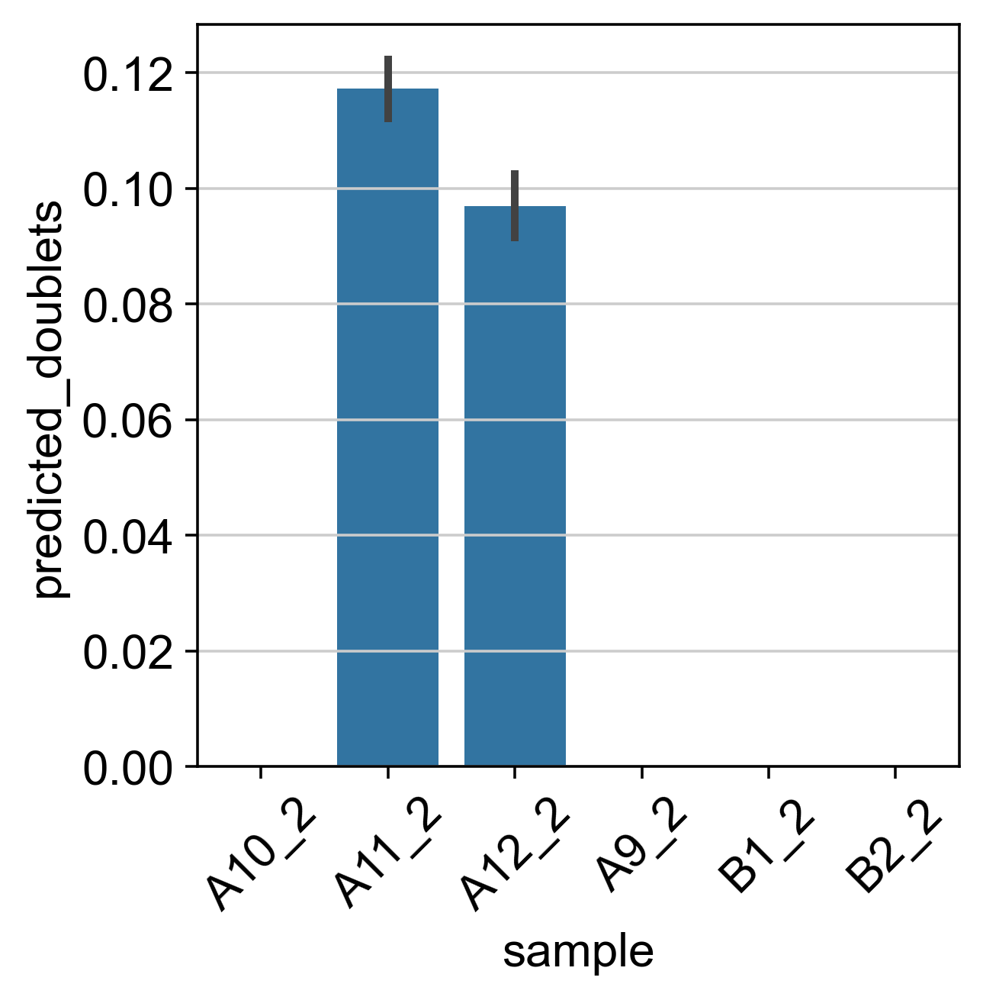

In [11]:
sb.barplot(x=adata.obs['sample'], y=adata.obs['predicted_doublets'])
plt.xticks(rotation = 45)

### Saving raw data

In [12]:
sample_object = adata.copy()
sample_object

AnnData object with n_obs × n_vars = 188253 × 32285
    obs: 'sample', 'genotype', 'batch', 'doublet_scores', 'predicted_doublets'
    var: 'gene_ids', 'feature_types', 'genome'

## Compute QC stats

In [13]:
sample_object.shape

(188253, 32285)

### Labelling Mt and Ribo genes

In [14]:
sample_object.var['mt'] = sample_object.var_names.str.startswith('mt-') 
sample_object.var['ribo'] = sample_object.var_names.str.startswith(("Rps","Rpl"))
sample_object.var

,gene_ids,feature_types,genome,mt,ribo
Xkr4,ENSMUSG00000051951,Gene Expression,NA,False,False
Gm1992,ENSMUSG00000089699,Gene Expression,NA,False,False
Gm19938,ENSMUSG00000102331,Gene Expression,NA,False,False
Gm37381,ENSMUSG00000102343,Gene Expression,NA,False,False
Rp1,ENSMUSG00000025900,Gene Expression,NA,False,False
...,...,...,...,...,...
AC124606.1,ENSMUSG00000095523,Gene Expression,NA,False,False
AC133095.2,ENSMUSG00000095475,Gene Expression,NA,False,False
AC133095.1,ENSMUSG00000094855,Gene Expression,NA,False,False
AC234645.1,ENSMUSG00000095019,Gene Expression,NA,False,False


In [15]:
ribo_counts = sample_object.var['ribo'].value_counts()

mt_counts = sample_object.var['mt'].value_counts()

print("Counts of Ribosomal (ribo) Genes:")
print("False:", ribo_counts.get(False, 0))
print("True:", ribo_counts.get(True, 0))
print("\nCounts of Mitochondrial (mt) Genes:")
print("False:", mt_counts.get(False, 0))
print("True:", mt_counts.get(True, 0))

Counts of Ribosomal (ribo) Genes:
False: 32184
True: 101

Counts of Mitochondrial (mt) Genes:
False: 32272
True: 13


### Calculating QC metrics per cell

In [16]:
sc.pp.calculate_qc_metrics(sample_object, qc_vars = ['mt','ribo'], percent_top = None, log1p = False, inplace = True)

In [17]:
sample_object

AnnData object with n_obs × n_vars = 188253 × 32285
    obs: 'sample', 'genotype', 'batch', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

### Visualization of qc metrics

Text(0.5, 1.0, 'Mt and Ribo percentages - Before filtering')

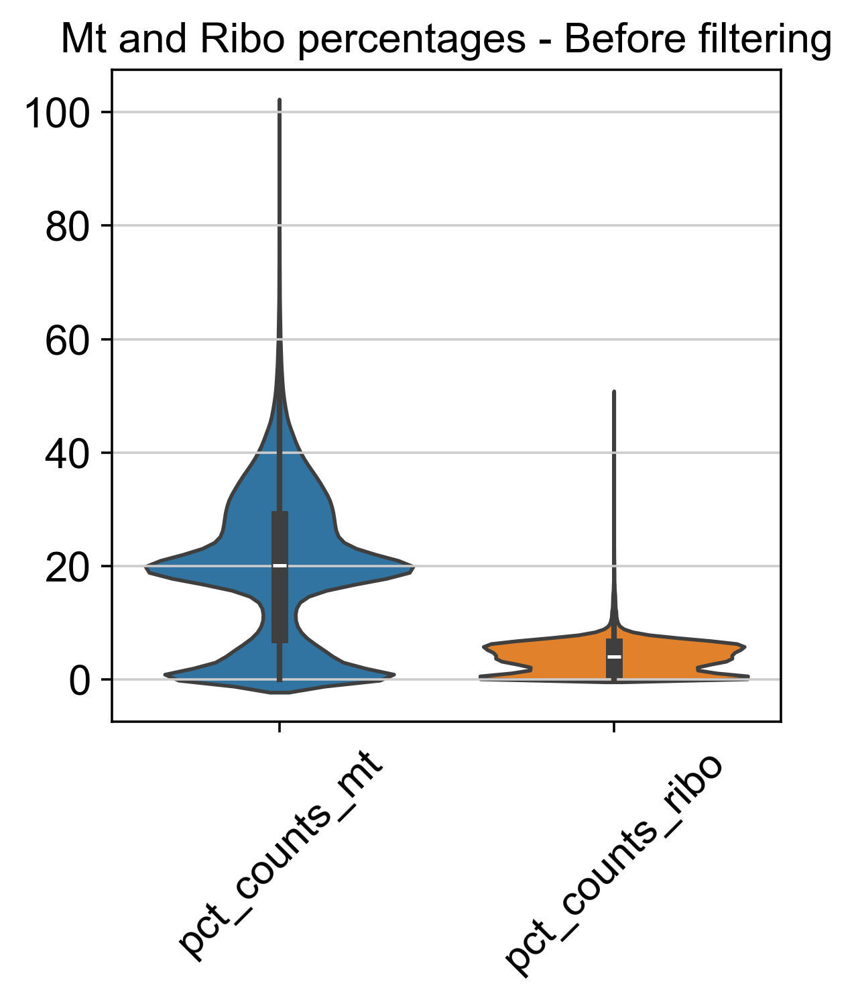

In [18]:
variables = ['pct_counts_mt', 'pct_counts_ribo']

sb.violinplot(data=sample_object.obs[variables])
plt.xticks(rotation=45)
plt.title(f'Mt and Ribo percentages - Before filtering')

##### *Description of violin plots*

**Violin Body**: The central part of the violin plot represents the probability density of the data.

**Box Plot**:
        Median (White line inside the box) Q2 ;
        Quartiles (the edges of the box) Q1,Q3 - Height of box represent Interquartile region (Q1-Q2-Q3) ;
        Outliers (points beyond the whiskers)

**Whiskers**: The whiskers extend from the box to the minimum and maximum values within 1.5 times the IQR from the first and third quartiles

**Outliers**: Individual data points beyond the whiskers

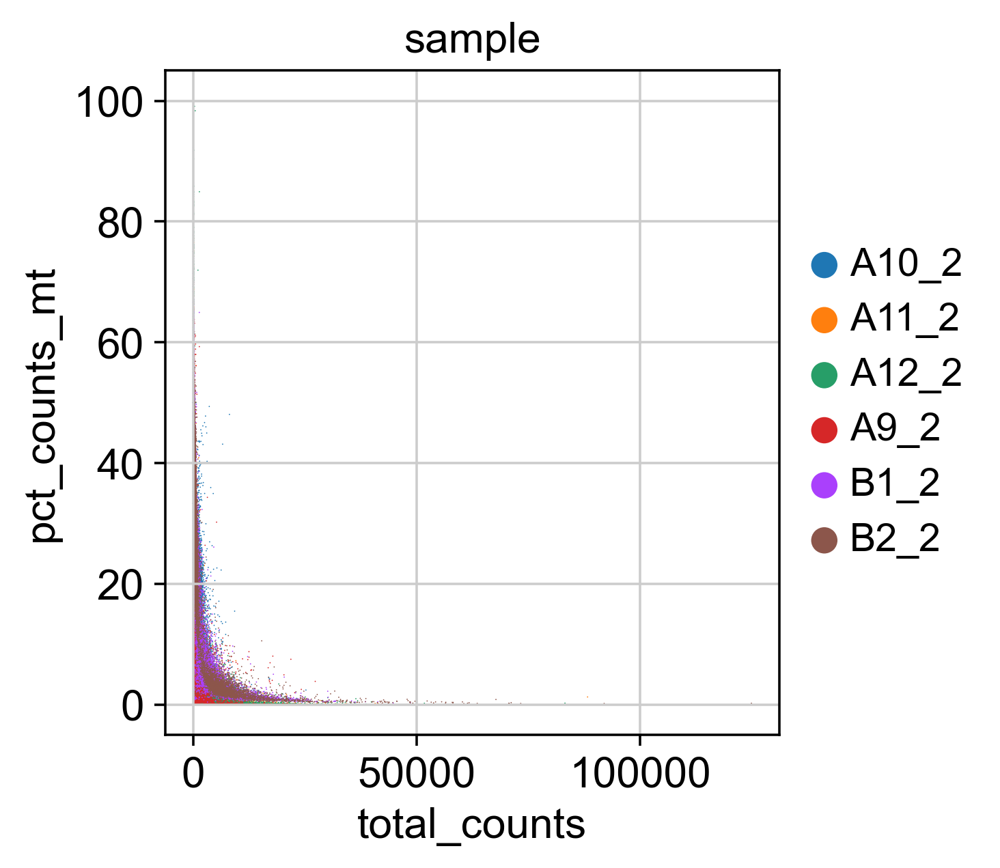

In [19]:
sc.pl.scatter(sample_object, x = 'total_counts', y = 'pct_counts_mt', color = "sample")

In [20]:
sample_object.obs

,sample,genotype,batch,doublet_scores,predicted_doublets,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
CTTCAATCAATAGTCC-1-A9_2-A9_2,A9_2,WT,A9_2,0.077739,False,6363,42171.0,41.0,0.097223,47.0,0.111451
GATGCTAAGCAGTAAT-1-A9_2-A9_2,A9_2,WT,A9_2,0.405405,False,6638,27328.0,1056.0,3.864169,397.0,1.452722
GCTACCTAGGTTGGTG-1-A9_2-A9_2,A9_2,WT,A9_2,0.229050,False,5794,26030.0,103.0,0.395697,90.0,0.345755
GATTCTTCACACCTTC-1-A9_2-A9_2,A9_2,WT,A9_2,0.248509,False,5740,24212.0,615.0,2.540063,223.0,0.921031
TAAGCCACATGAGAAT-1-A9_2-A9_2,A9_2,WT,A9_2,0.140645,False,5005,22787.0,37.0,0.162373,22.0,0.096546
...,...,...,...,...,...,...,...,...,...,...,...
CAGCAATAGAAGTCCG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.024096,False,11,18.0,6.0,33.333333,0.0,0.000000
TTGATGGGTTCCGCTT-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.020741,False,5,9.0,7.0,77.777778,0.0,0.000000
CCTCCAATCCGATAAC-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.020741,False,7,16.0,13.0,81.250000,0.0,0.000000
GGGCTACTCGGAGTAG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.035455,False,12,17.0,12.0,70.588235,0.0,0.000000


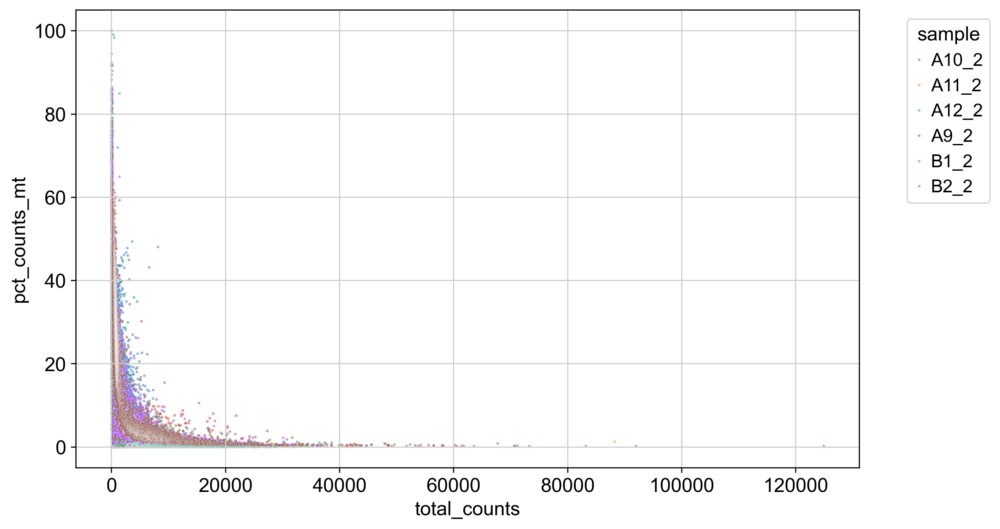

In [21]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_mt' , hue ='sample', alpha = 0.5, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

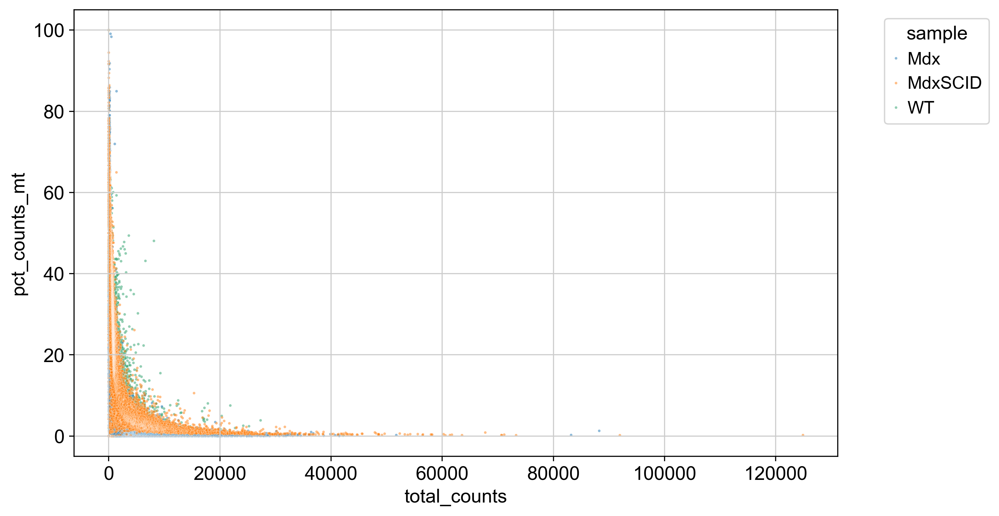

In [22]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_mt' , hue ='genotype', alpha = 0.5, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

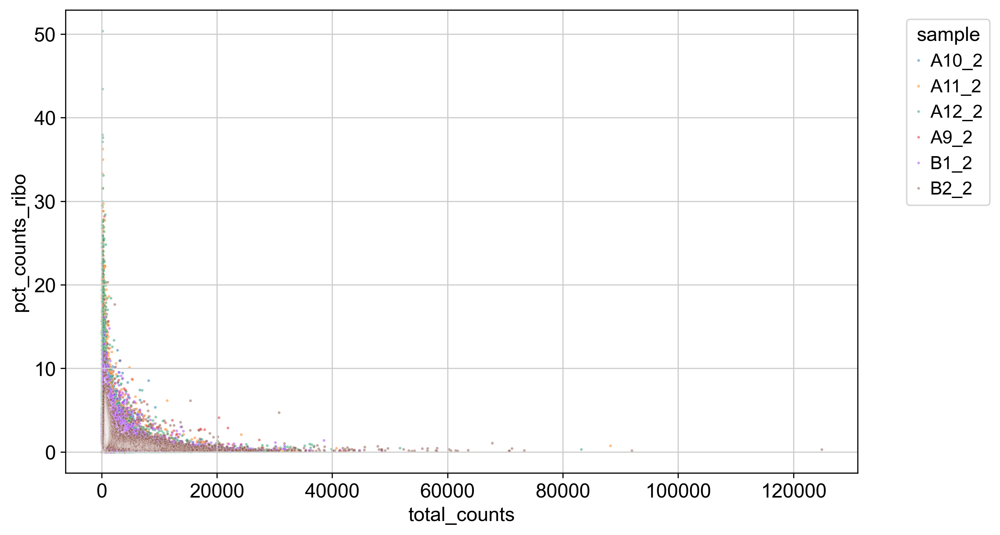

In [23]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_ribo' , hue ='sample', alpha = 0.5, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

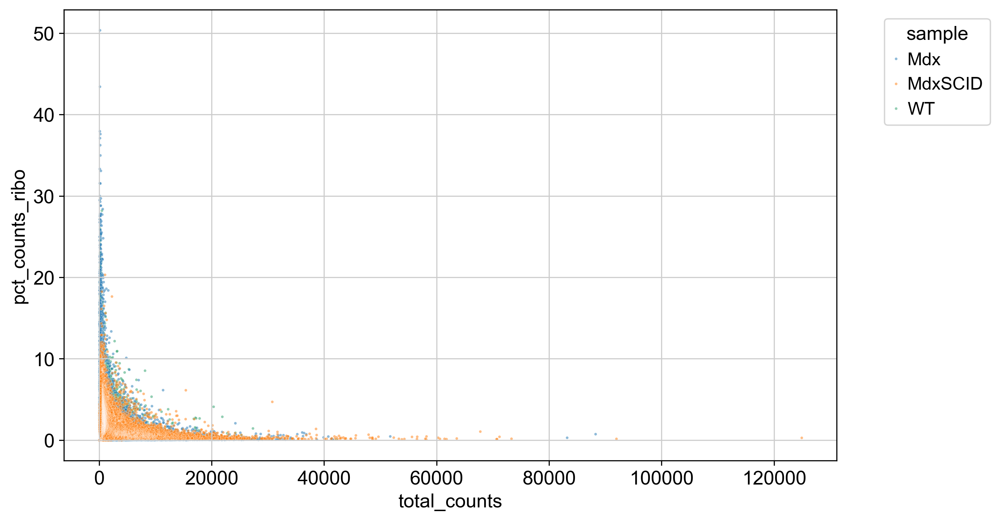

In [24]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='pct_counts_ribo' , hue ='genotype', alpha = 0.5, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

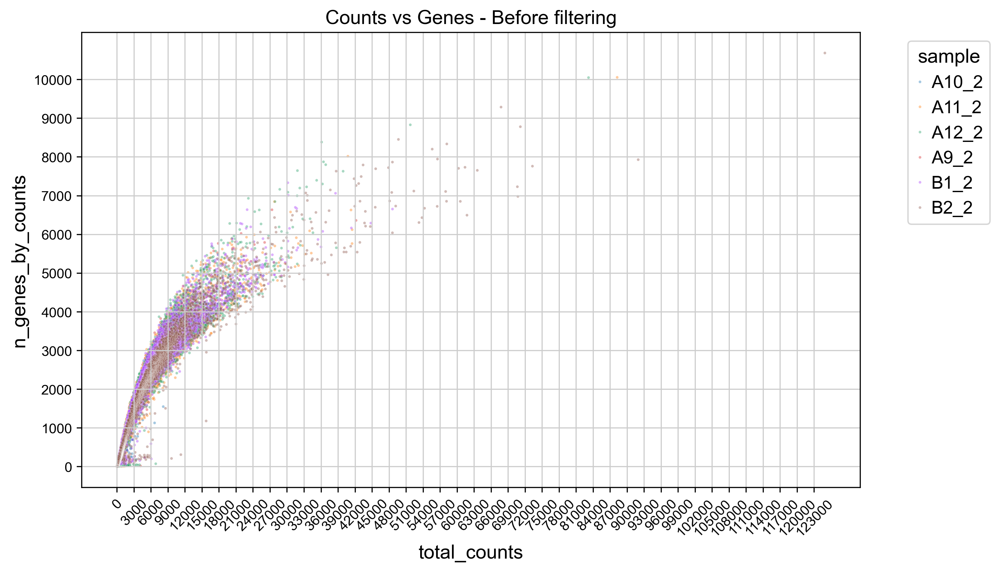

In [25]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=sample_object.obs, x='total_counts', y='n_genes_by_counts' , hue ='sample', alpha = 0.4, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(range(0, int(max(sample_object.obs['total_counts'])) + 1, 3000),rotation=45, fontsize = 10)
plt.yticks(range(0, int(max(sample_object.obs['n_genes_by_counts'])) + 1, 1000),fontsize = 10)
plt.title(f'Counts vs Genes - Before filtering')
plt.show()

## Sex covariate analysis

### Ensembl annotations

In [26]:
annot = sc.queries.biomart_annotations(
        "mmusculus",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

In [27]:
annot.head()

,ensembl_gene_id,start_position,end_position,chromosome_name
external_gene_name,,,,
mt-Tf,ENSMUSG00000064336,1,68,MT
mt-Rnr1,ENSMUSG00000064337,70,1024,MT
mt-Tv,ENSMUSG00000064338,1025,1093,MT
mt-Rnr2,ENSMUSG00000064339,1094,2675,MT
mt-Tl1,ENSMUSG00000064340,2676,2750,MT


### Chr Y genes calculation

In [28]:
chrY_genes = sample_object.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

Index(['Gm29089', 'Zfy1', 'Uba1y', 'Gm28588', 'Gm28587', 'Kdm5d', 'Eif2s3y',
       'Gm29650', 'Uty', 'Ddx3y',
       ...
       'Gm28672', 'Gm28670', 'Gm28673', 'Gm28674', 'Gm21996', 'Gm28930',
       'Gm29504', 'Gm20837', 'Gm28300', 'Gm28301'],
      dtype='object', length=709)

In [29]:
sample_object.obs['percent_chrY'] = np.sum(
    sample_object[:, chrY_genes].X, axis = 1) / np.sum(sample_object.X, axis = 1) * 100

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/1554486360.py:1: RuntimeWarning: invalid value encountered in divide
  sample_object.obs['percent_chrY'] = np.sum(


### XIST counts

#### Steps followed

1. Select variables having 'xist' in var_names
2. Counts and percentage of XIST 
3. Creating a series to store data
4. Assigning the series back to our data into obs

In [30]:
xist_counts = sample_object.X[:, sample_object.var_names.str.match('Xist')].toarray()
xist_percentage = (np.sum(xist_counts, axis=1) / sample_object.obs['total_counts']) * 100

xist_counts_series = pd.Series(xist_counts.squeeze(), index = sample_object.obs_names, name = "XIST-counts")
xist_percentage_series = pd.Series(xist_percentage, index=sample_object.obs_names, name="percent_XIST")

sample_object.obs["XIST-counts"] = xist_counts_series
sample_object.obs["XIST-percentage"] = xist_percentage_series

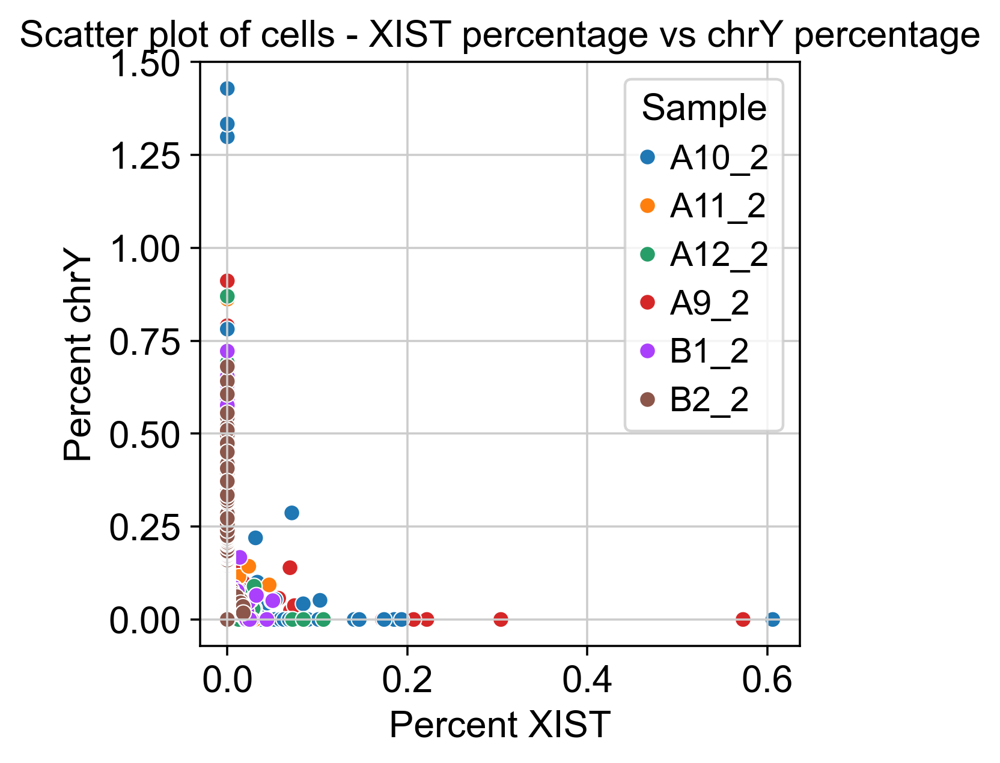

In [31]:
sb.scatterplot(data=sample_object.obs, x="XIST-percentage", y='percent_chrY', hue='sample')
plt.xlabel('Percent XIST')
plt.ylabel('Percent chrY')
plt.title('Scatter plot of cells - XIST percentage vs chrY percentage')
plt.legend(title='Sample')
plt.show()

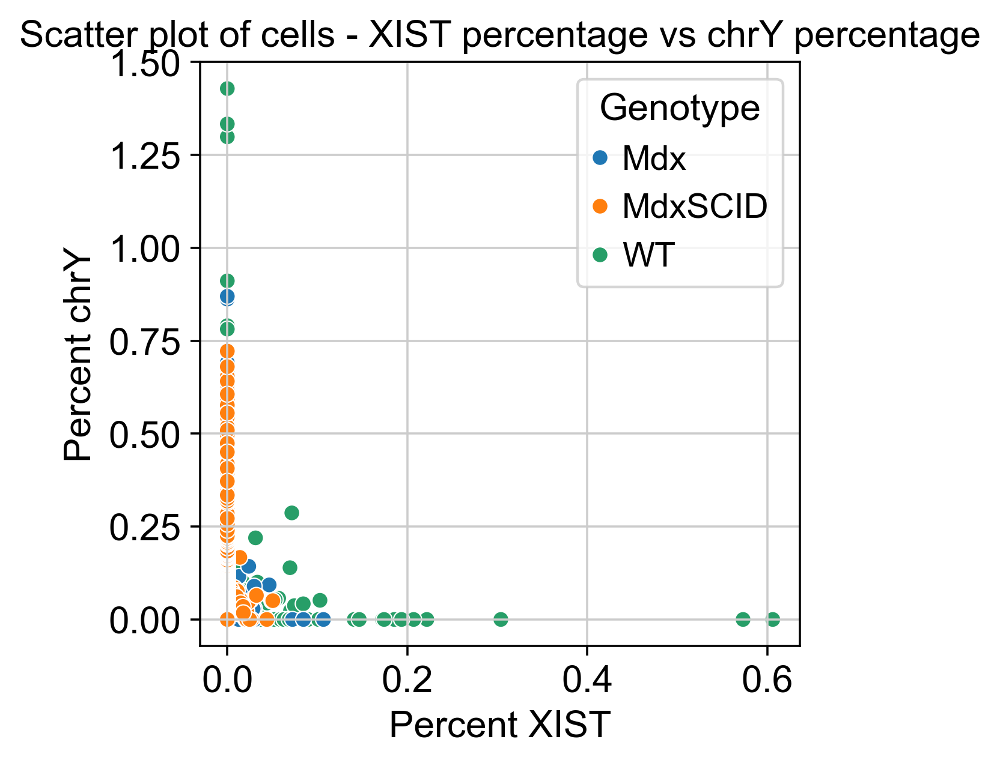

In [32]:
sb.scatterplot(data=sample_object.obs, x="XIST-percentage", y='percent_chrY', hue='genotype')
plt.xlabel('Percent XIST')
plt.ylabel('Percent chrY')
plt.title('Scatter plot of cells - XIST percentage vs chrY percentage')
plt.legend(title='Genotype')
plt.show()

/Users/srivalli/conda/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/Users/srivalli/conda/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/Users/srivalli/conda/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/Users/srivalli/conda/envs/scanpy/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has b

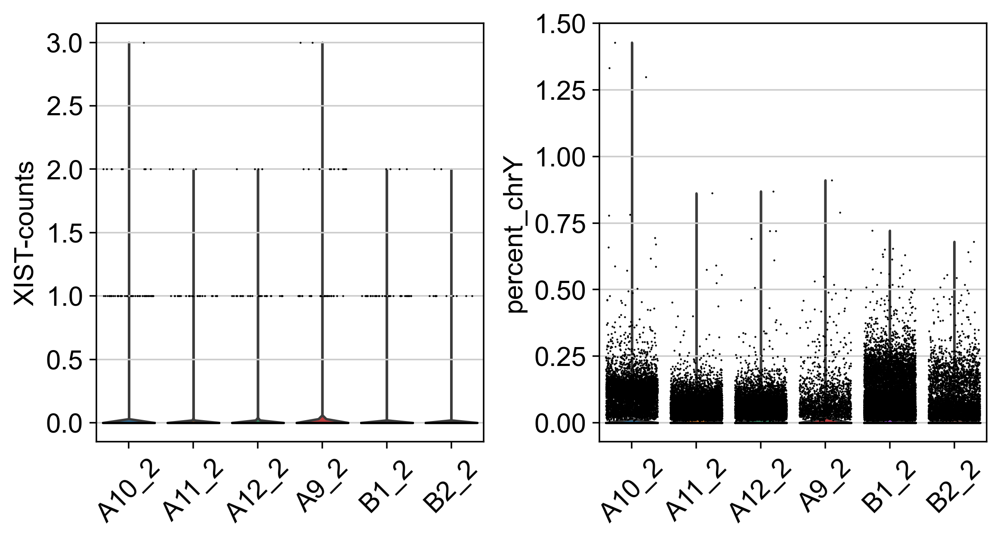

In [33]:
sc.pl.violin(sample_object, ["XIST-counts", "percent_chrY"], jitter = 0.4, groupby = 'sample', rotation = 45)

### Validation of sex covariates

In [34]:
zero_y_counts = len(sample_object.obs[sample_object.obs['percent_chrY'] == 0])
zero_xist_counts = len(sample_object.obs[sample_object.obs['XIST-percentage'] == 0])
both_zero_counts = len(sample_object.obs[(sample_object.obs['percent_chrY'] == 0) & (sample_object.obs['XIST-percentage'] == 0)])

print("Number of observations with 0 Y chromosome counts:", zero_y_counts)
print("Number of observations with 0 XIST counts:", zero_xist_counts)
print("Number of observations with both 0 Y chromosome counts and 0 XIST counts:", both_zero_counts)

Number of observations with 0 Y chromosome counts: 148228
Number of observations with 0 XIST counts: 188033
Number of observations with both 0 Y chromosome counts and 0 XIST counts: 148184


#### Steps followed - Cellular level

1. Create a 'gender_check_cov' variable and classify as male and female based on chrY percentage and XIST percentage
2. Create a 'gender_comparison' variable and classify as true or false in comparision with gender col we have
3. Calculate the counts of True and false
4. Calculate the percentage of True and false counts

In [35]:
sample_object.obs['gender_check_cov'] = np.where(
    (sample_object.obs['percent_chrY'] == 0) & (sample_object.obs['XIST-percentage'] == 0),
    'None',
    np.where(
        sample_object.obs['percent_chrY'] > sample_object.obs['XIST-percentage'],
        'Male',
        'Female'
    )
)

sample_object.obs

,sample,genotype,batch,doublet_scores,predicted_doublets,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,percent_chrY,XIST-counts,XIST-percentage,gender_check_cov
CTTCAATCAATAGTCC-1-A9_2-A9_2,A9_2,WT,A9_2,0.077739,False,6363,42171.0,41.0,0.097223,47.0,0.111451,0.068768,1.0,0.002371,Male
GATGCTAAGCAGTAAT-1-A9_2-A9_2,A9_2,WT,A9_2,0.405405,False,6638,27328.0,1056.0,3.864169,397.0,1.452722,0.025615,0.0,0.000000,Male
GCTACCTAGGTTGGTG-1-A9_2-A9_2,A9_2,WT,A9_2,0.229050,False,5794,26030.0,103.0,0.395697,90.0,0.345755,0.030734,0.0,0.000000,Male
GATTCTTCACACCTTC-1-A9_2-A9_2,A9_2,WT,A9_2,0.248509,False,5740,24212.0,615.0,2.540063,223.0,0.921031,0.033041,0.0,0.000000,Male
TAAGCCACATGAGAAT-1-A9_2-A9_2,A9_2,WT,A9_2,0.140645,False,5005,22787.0,37.0,0.162373,22.0,0.096546,0.070215,0.0,0.000000,Male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CAGCAATAGAAGTCCG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.024096,False,11,18.0,6.0,33.333333,0.0,0.000000,0.000000,0.0,0.000000,None
TTGATGGGTTCCGCTT-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.020741,False,5,9.0,7.0,77.777778,0.0,0.000000,0.000000,0.0,0.000000,None
CCTCCAATCCGATAAC-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.020741,False,7,16.0,13.0,81.250000,0.0,0.000000,0.000000,0.0,0.000000,None
GGGCTACTCGGAGTAG-1-B2_2-B2_2,B2_2,MdxSCID,B2_2,0.035455,False,12,17.0,12.0,70.588235,0.0,0.000000,0.000000,0.0,0.000000,None


#### Steps followed - sample level

1. Group by sample and calculate the gender for each sample
2. Classify samples based on the counts of gender_check_cov
3. Calculate gender comparison at the sample level by considering the highest number of male, female and none classification of cells in the sample
4. Create DataFrame for classification
5. Display the results

In [36]:
sample_gender_list = []

for sample in sample_object.obs['sample'].unique():
    sample_data = sample_object.obs[sample_object.obs['sample'] == sample]
    gender_counts = sample_data['gender_check_cov'].value_counts()
    
    if 'Male' in gender_counts.index and 'Female' in gender_counts.index and 'None' in gender_counts.index:
        if gender_counts['None'] > gender_counts['Male'] and gender_counts['None'] > gender_counts['Female']:
            sample_gender = 'None'
        elif gender_counts['Male'] > gender_counts['Female']:
            sample_gender = 'Male'
        else:
            sample_gender = 'Female'
    elif 'Male' in gender_counts.index and 'Female' in gender_counts.index:
        if gender_counts['Male'] > gender_counts['Female']:
            sample_gender = 'Male'
        else:
            sample_gender = 'Female'
    elif 'Male' in gender_counts.index:
        sample_gender = 'Male'
    elif 'Female' in gender_counts.index:
        sample_gender = 'Female'
    else:
        sample_gender = 'None'
    
    sample_gender_list.append((sample, sample_gender))

sample_gender_df = pd.DataFrame(sample_gender_list, columns=['sample', 'gender'])

print(sample_gender_df)

  sample gender
0   A9_2   None
1  A10_2   None
2  A11_2   Male
3  A12_2   Male
4   B1_2   None
5   B2_2   None


([0, 1, 2], [Text(0, 0, 'Mdx'), Text(1, 0, 'MdxSCID'), Text(2, 0, 'WT')])

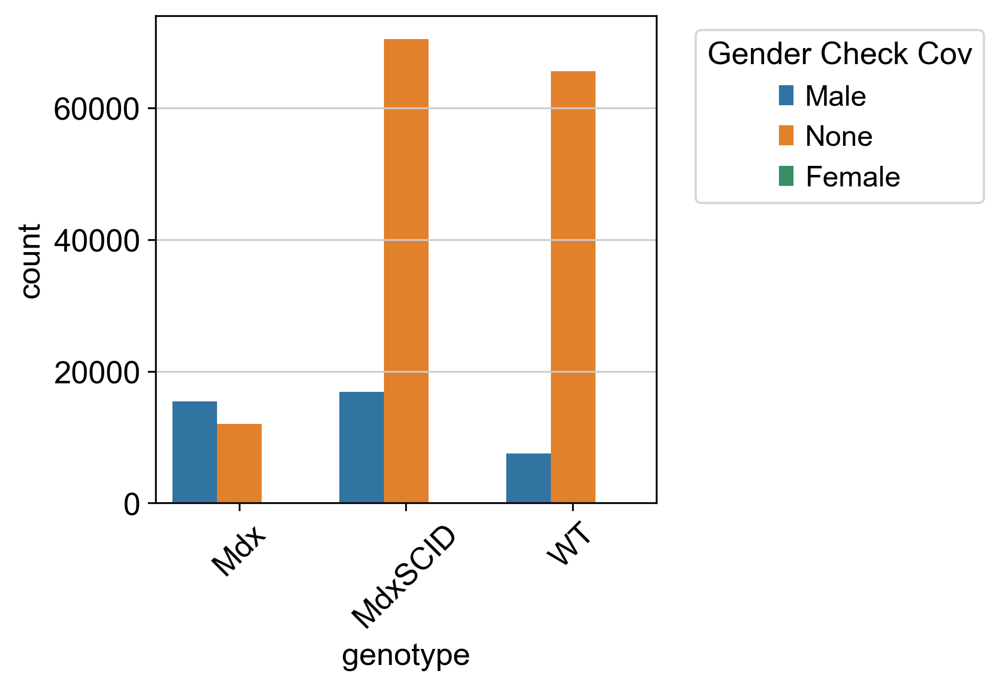

In [37]:
sb.countplot(data=sample_object.obs, x ='genotype',hue='gender_check_cov')
plt.legend(title='Gender Check Cov', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation = 45)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'A10_2'),
  Text(1, 0, 'A11_2'),
  Text(2, 0, 'A12_2'),
  Text(3, 0, 'A9_2'),
  Text(4, 0, 'B1_2'),
  Text(5, 0, 'B2_2')])

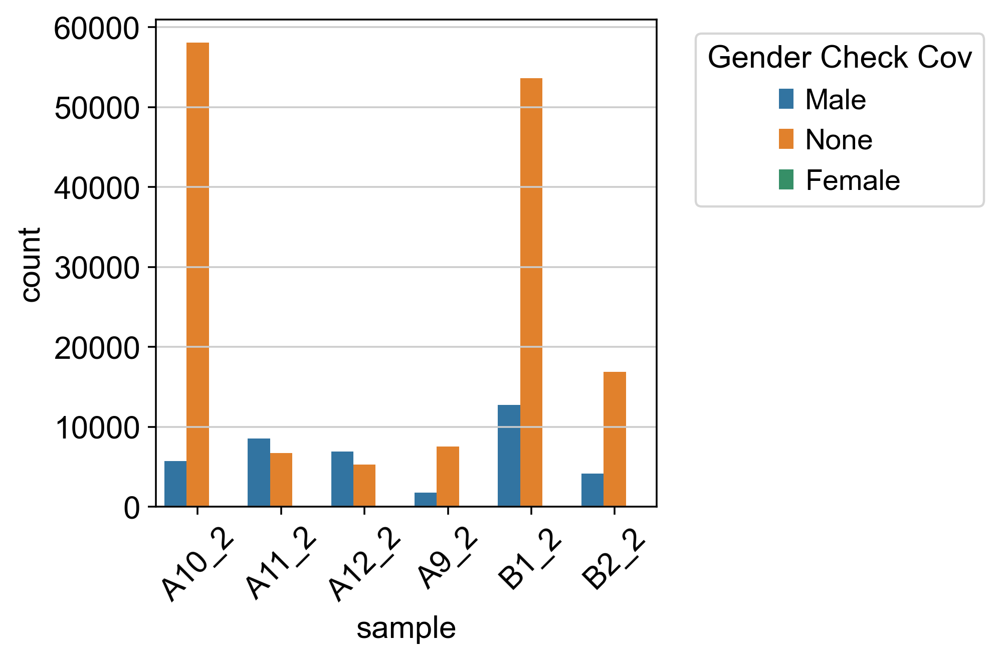

In [38]:
sb.countplot(data=sample_object.obs, x ='sample',hue='gender_check_cov')
plt.legend(title='Gender Check Cov', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation = 45)

In [39]:
genotype_counts = sample_object.obs.groupby(['sample', 'genotype','gender_check_cov']).size().unstack(fill_value=0)
print(genotype_counts)

gender_check_cov  Female   Male   None
sample genotype                       
A10_2  Mdx             0      0      0
       MdxSCID         0      0      0
       WT             34   5747  58070
A11_2  Mdx             9   8575   6713
       MdxSCID         0      0      0
       WT              0      0      0
A12_2  Mdx             9   6938   5314
       MdxSCID         0      0      0
       WT              0      0      0
A9_2   Mdx             0      0      0
       MdxSCID         0      0      0
       WT             21   1810   7575
B1_2   Mdx             0      0      0
       MdxSCID        16  12751  53625
       WT              0      0      0
B2_2   Mdx             0      0      0
       MdxSCID         1   4158  16887
       WT              0      0      0


/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/1743670494.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  genotype_counts = sample_object.obs.groupby(['sample', 'genotype','gender_check_cov']).size().unstack(fill_value=0)


## Calculate cell cycle scores

### Downloading the list of cell cycle genes

In [40]:
!if [ ! -f ../data/regev_lab_cell_cycle_genes.txt ]; then curl -o ../data/regev_lab_cell_cycle_genes.txt https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt; fi

### Marking cell cycle genes

#### Steps followed

1. Loading genes and captilizing 
2. Printing the length of cell cycle genes list
3. Split genes into 2 lists (#First 43 genes,#Gene 43 to end)
4. Filtering cell cycle genes only if present in processed_gene_names
5. Print the list of cell cycle genes observed in our data

In [41]:
cell_cycle_genes = [x.strip() for x in open('../data/regev_lab_cell_cycle_genes.txt')]
cell_cycle_genes = [gene.capitalize() for gene in cell_cycle_genes]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in sample_object.var_names]
print(len(cell_cycle_genes))

97
94


In [42]:
cell_cycle_genes

['Mcm5',
 'Pcna',
 'Tyms',
 'Fen1',
 'Mcm2',
 'Mcm4',
 'Rrm1',
 'Ung',
 'Gins2',
 'Mcm6',
 'Cdca7',
 'Dtl',
 'Prim1',
 'Uhrf1',
 'Hells',
 'Rfc2',
 'Rpa2',
 'Nasp',
 'Rad51ap1',
 'Gmnn',
 'Wdr76',
 'Slbp',
 'Ccne2',
 'Ubr7',
 'Pold3',
 'Msh2',
 'Atad2',
 'Rad51',
 'Rrm2',
 'Cdc45',
 'Cdc6',
 'Exo1',
 'Tipin',
 'Dscc1',
 'Blm',
 'Casp8ap2',
 'Usp1',
 'Clspn',
 'Pola1',
 'Chaf1b',
 'Brip1',
 'E2f8',
 'Hmgb2',
 'Cdk1',
 'Nusap1',
 'Ube2c',
 'Birc5',
 'Tpx2',
 'Top2a',
 'Ndc80',
 'Cks2',
 'Nuf2',
 'Cks1b',
 'Mki67',
 'Tmpo',
 'Cenpf',
 'Tacc3',
 'Smc4',
 'Ccnb2',
 'Ckap2l',
 'Ckap2',
 'Aurkb',
 'Bub1',
 'Kif11',
 'Anp32e',
 'Tubb4b',
 'Gtse1',
 'Kif20b',
 'Hjurp',
 'Cdca3',
 'Cdc20',
 'Ttk',
 'Cdc25c',
 'Kif2c',
 'Rangap1',
 'Ncapd2',
 'Dlgap5',
 'Cdca2',
 'Cdca8',
 'Ect2',
 'Kif23',
 'Hmmr',
 'Aurka',
 'Psrc1',
 'Anln',
 'Lbr',
 'Ckap5',
 'Cenpe',
 'Ctcf',
 'Nek2',
 'G2e3',
 'Gas2l3',
 'Cbx5',
 'Cenpa']

### Creating basic anndata and normalization for cell cycle score calculation

In [43]:
adata_log = anndata.AnnData(X = sample_object.X,  var = sample_object.var, obs = sample_object.obs)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['Prex2', 'Cox5b', 'Aff3', 'Tbc1d8', 'Fhl2', 'Tex30', 'Gulp1', 'Col3a1', 'Slc40a1', 'Stat4', 'Stk17b', 'Plcl1', 'Nrp2', 'Erbb4', 'Igfbp5', 'Speg', 'Inha', 'Pid1', 'Ptma', 'Inpp5d', 'Gm10550', 'Pam', 'Phlpp1', 'Clasp1', 'Nckap5', 'Lax1', 'Prelp', 'Kdm5b', 'Lad1', 'Tnnt2', 'Gm26936', 'Ptprc', 'Cfh', 'Kcnt2', 'Ptgs2', 'Hmcn1', 'Ivns1abp', 'Rgl1', 'Rabgap1l', 'Dnm3', 'Mgst3', 'Pbx1', 'Rgs5', 'Gm7694', 'B4galt3', 'Arhgap30', 'Ly9', 'Pld5', 'Akt3', 'Itpkb', 'Rab3gap2', 'Tgfb2', 'Esrrg', 'Cd46', 'Dclre1c', 'Camk1d', 'Dhtkd1', 'Celf2', 'Itih2', 'Pter', 'Vim', 'Mrc1', 'Cacnb2', 'Gm13269', 'Plxdc2', 'Pip4k2a', 'Etl4', 'Zmynd19', 'Egfl7', 'Rapgef1', 'Usp20', 'D330023K18Rik', 'Eng', 'Tor2a', 'Hspa5', 'Gsn', 'Ptgs1', 'Strbp', 'Arhgap15', 'Zeb2', 'Gm13481', 'Pkp4', 'Tanc1', 'Grb14', 'Csrnp3', 'Scn7a', 'Xirp2', 'Stk39', 'Itga6', 'Prkra', 'Ttn', 'Ube2e3', 'Fam171b', 'Ptprj', 'Sl

/Users/srivalli/conda/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:196: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:00)


### Cell cycle score calculation

In [44]:
sc.tl.score_genes_cell_cycle(adata_log, s_genes = s_genes, g2m_genes = g2m_genes)

sample_object.obs['S_score'] = adata_log.obs['S_score']
sample_object.obs['G2M_score'] = adata_log.obs['G2M_score']
sample_object.obs['phase'] = adata_log.obs['phase']

sample_object

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    426 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    600 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


AnnData object with n_obs × n_vars = 188253 × 32285
    obs: 'sample', 'genotype', 'batch', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

In [45]:
cell_cycle_counts = sample_object.obs['phase'].value_counts()

cell_cycle_counts

phase
G1     98208
S      64818
G2M    25227
Name: count, dtype: int64

<Axes: xlabel='phase', ylabel='count'>

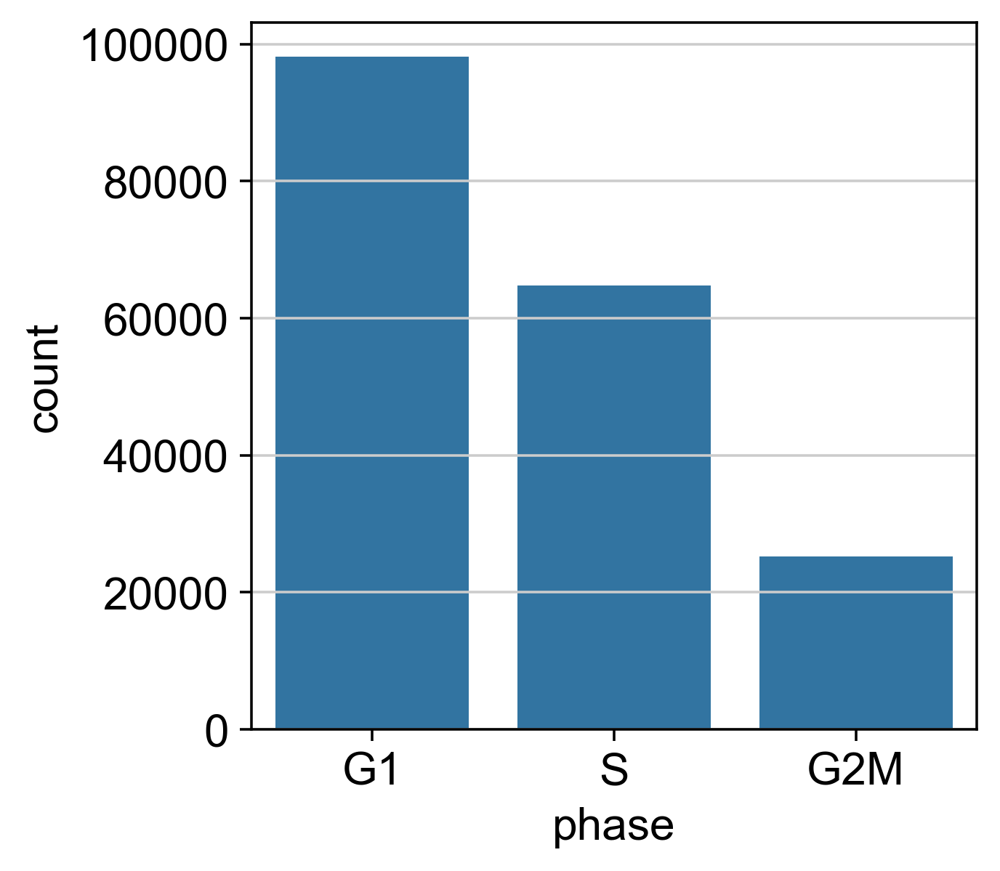

In [46]:
sb.countplot(data=sample_object.obs, x='phase')

([0, 1, 2], [Text(0, 0, 'Mdx'), Text(1, 0, 'MdxSCID'), Text(2, 0, 'WT')])

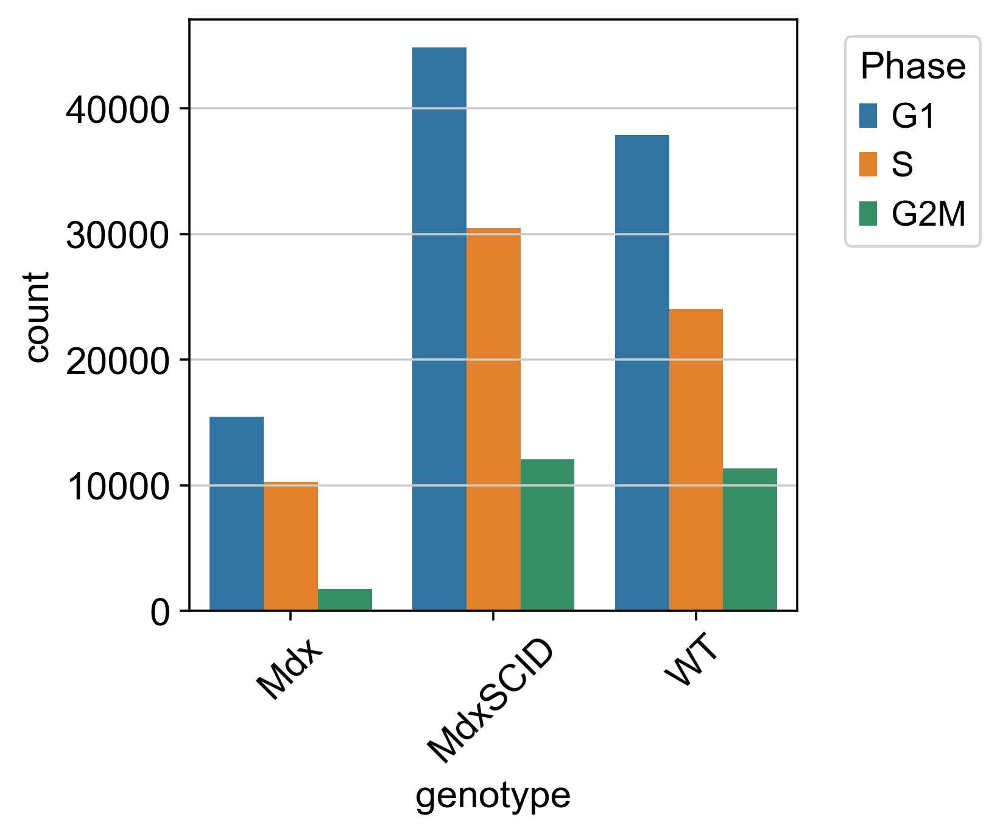

In [47]:
sb.countplot(data=sample_object.obs, x='genotype', hue= 'phase')
plt.legend(title = 'Phase',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'A10_2'),
  Text(1, 0, 'A11_2'),
  Text(2, 0, 'A12_2'),
  Text(3, 0, 'A9_2'),
  Text(4, 0, 'B1_2'),
  Text(5, 0, 'B2_2')])

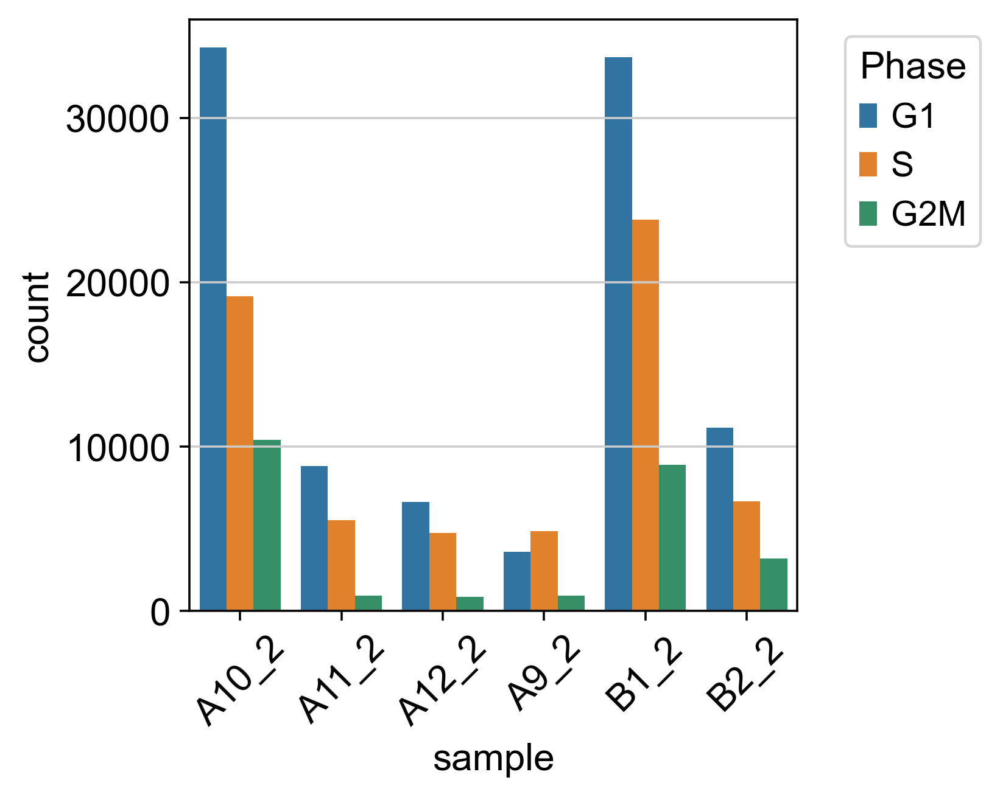

In [48]:
sb.countplot(data=sample_object.obs, x='sample', hue= 'phase')
plt.legend(title = 'Phase',bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)

## Data visualization

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/2687336048.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = sample_object.obs.groupby('sample')[var].median()


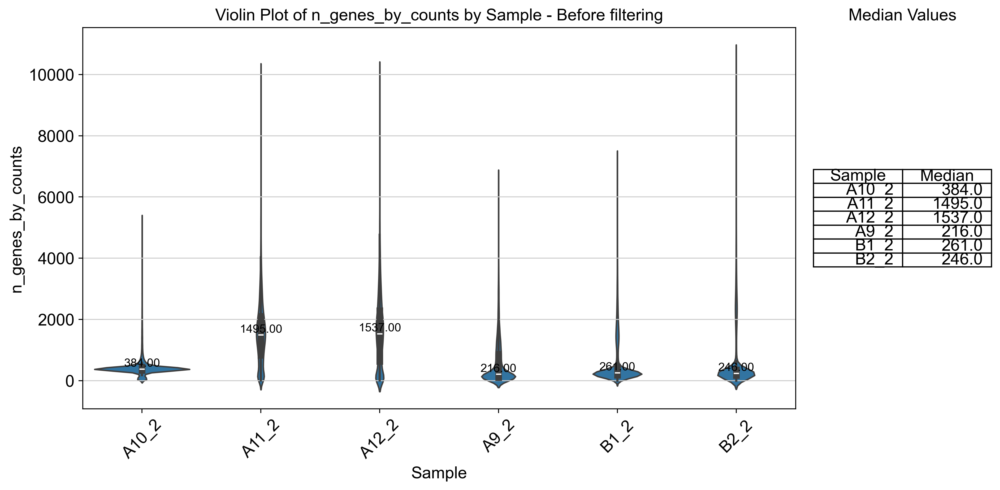

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/2687336048.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = sample_object.obs.groupby('sample')[var].median()


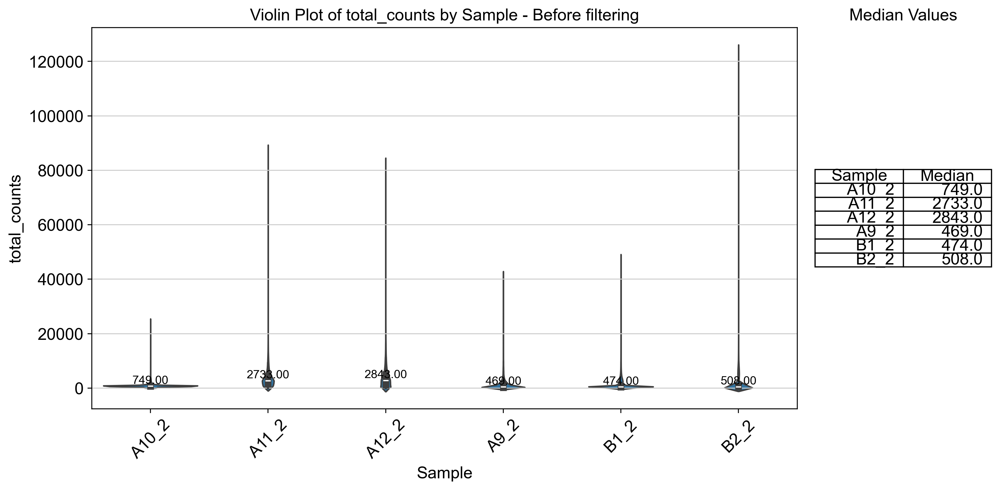

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/2687336048.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = sample_object.obs.groupby('sample')[var].median()


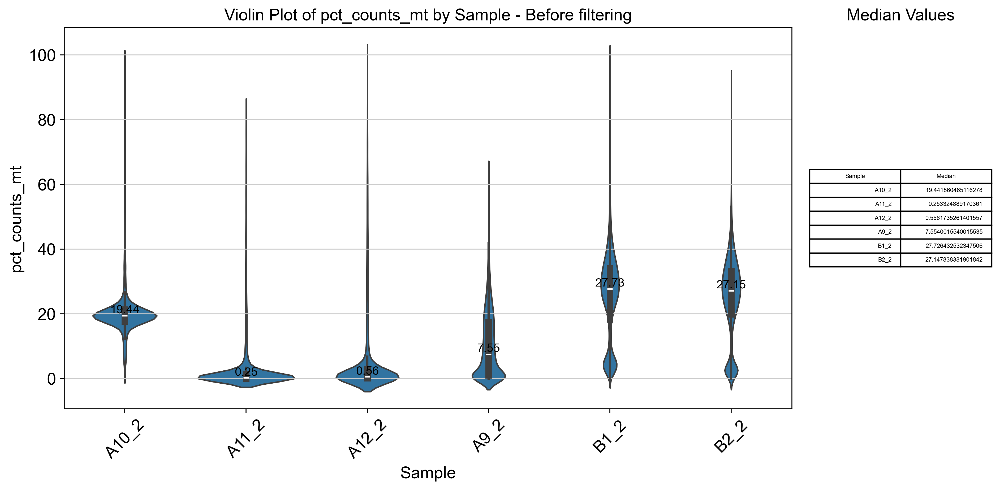

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/2687336048.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = sample_object.obs.groupby('sample')[var].median()


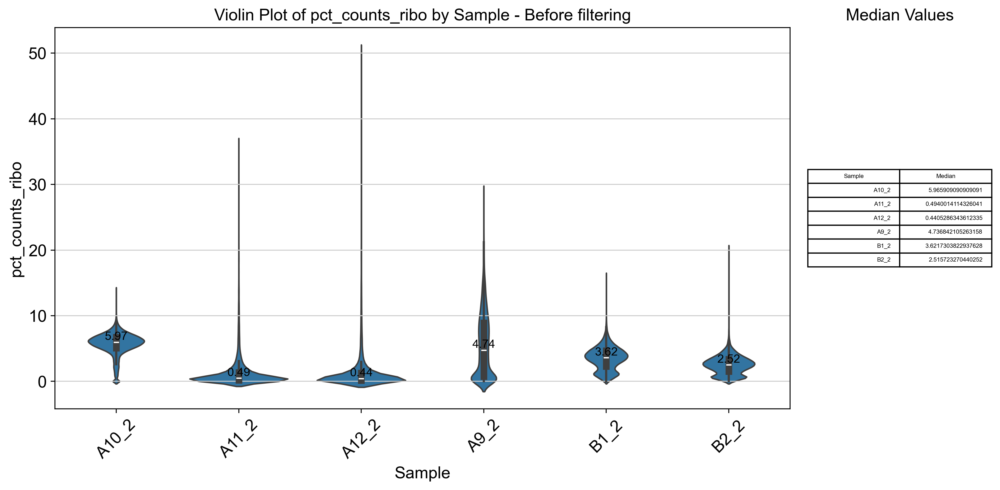

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/2687336048.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = sample_object.obs.groupby('sample')[var].median()


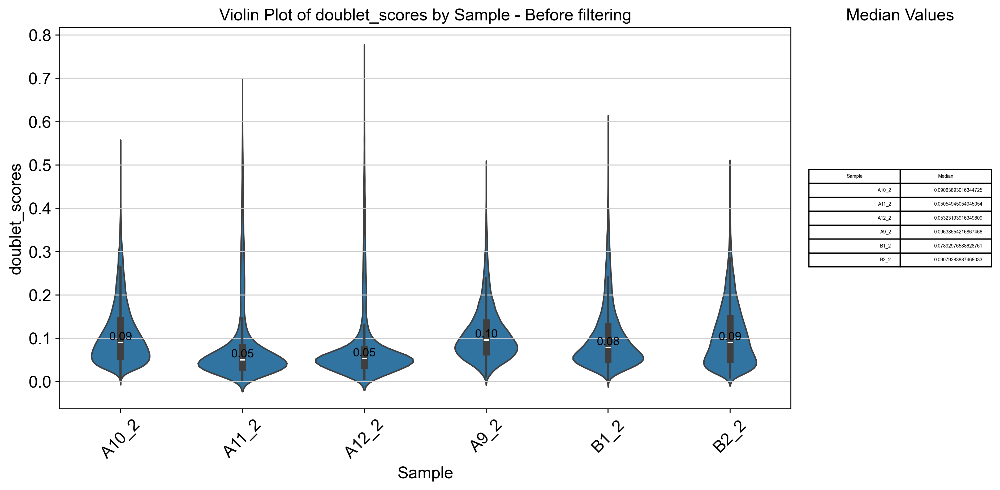

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/2687336048.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = sample_object.obs.groupby('sample')[var].median()


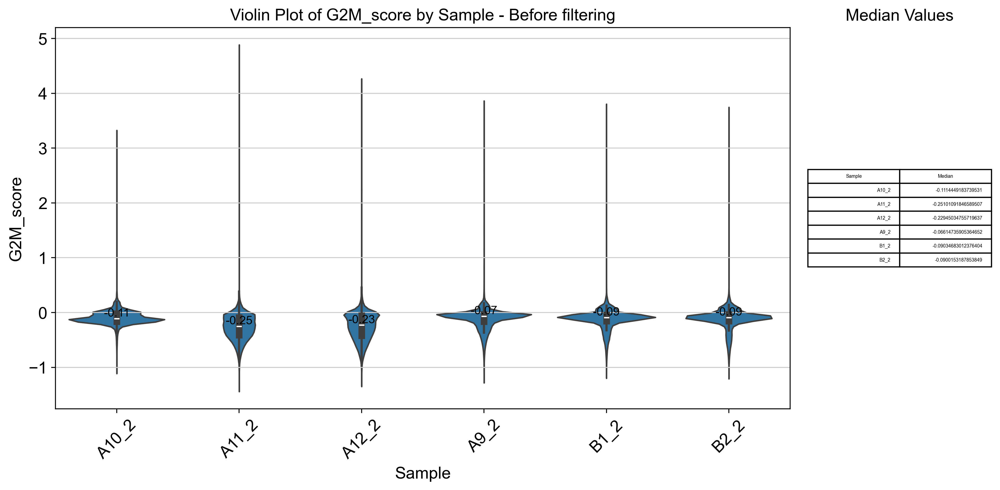

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/2687336048.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = sample_object.obs.groupby('sample')[var].median()


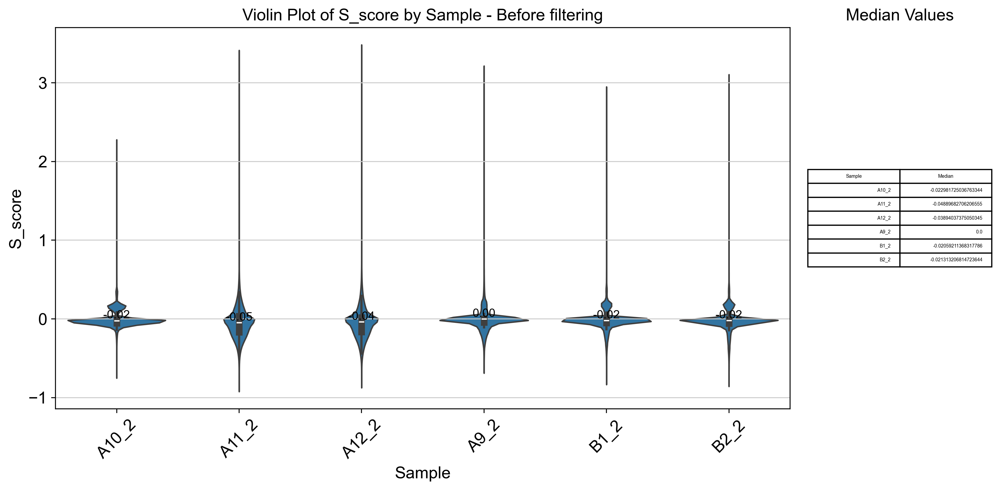

In [49]:
variables = 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'doublet_scores', 'G2M_score', 'S_score'

for var in variables:

    fig, ax = plt.subplots(figsize=(12, 6), ncols=2, gridspec_kw={'width_ratios': [4, 1]})

    sb.violinplot(data=sample_object.obs, x='sample', y=var, ax=ax[0])
   
    medians = sample_object.obs.groupby('sample')[var].median()

    for sample, median in medians.items():
        ax[0].text(sample, median, f'{median:.2f}', ha='center', va='bottom', color='black', fontsize=10)
    
    ax[0].set_title(f'Violin Plot of {var} by Sample - Before filtering')
    ax[0].set_xlabel('Sample')
    ax[0].set_ylabel(var)
    ax[0].tick_params(axis='x', rotation=45)

    median_df = pd.DataFrame({'Sample': medians.index, 'Median': medians.values})

    ax[1].axis('off')
    ax[1].table(cellText=median_df.values, colLabels=median_df.columns, loc='center')
    ax[1].set_title('Median Values')
    
    plt.tight_layout()
    plt.show()


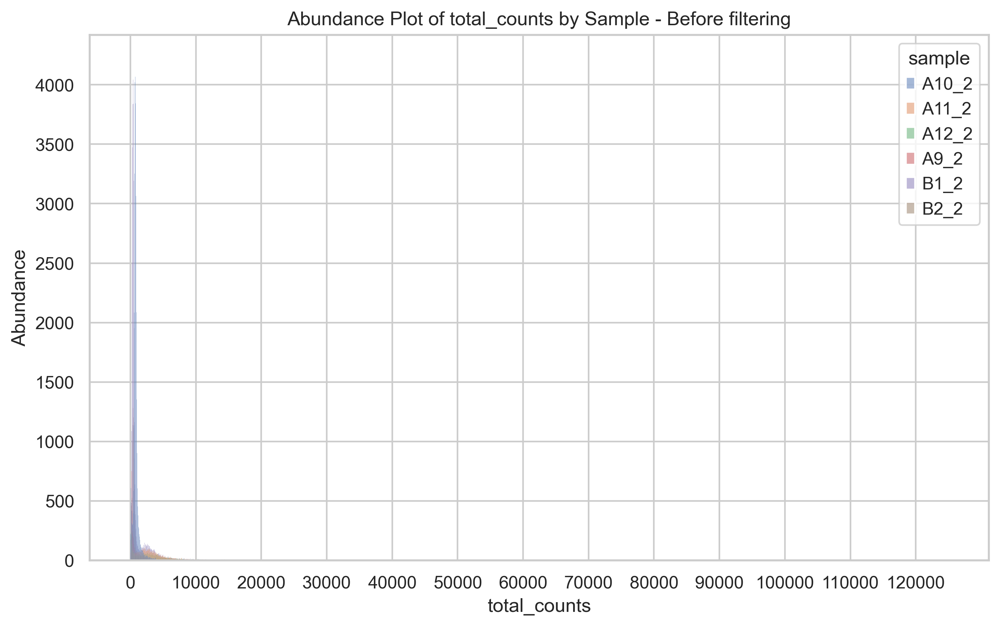

In [50]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'total_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = sample_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.xticks(range(0, int(max(sample_object.obs['total_counts'])) + 1, 10000))
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - Before filtering')
plt.show()

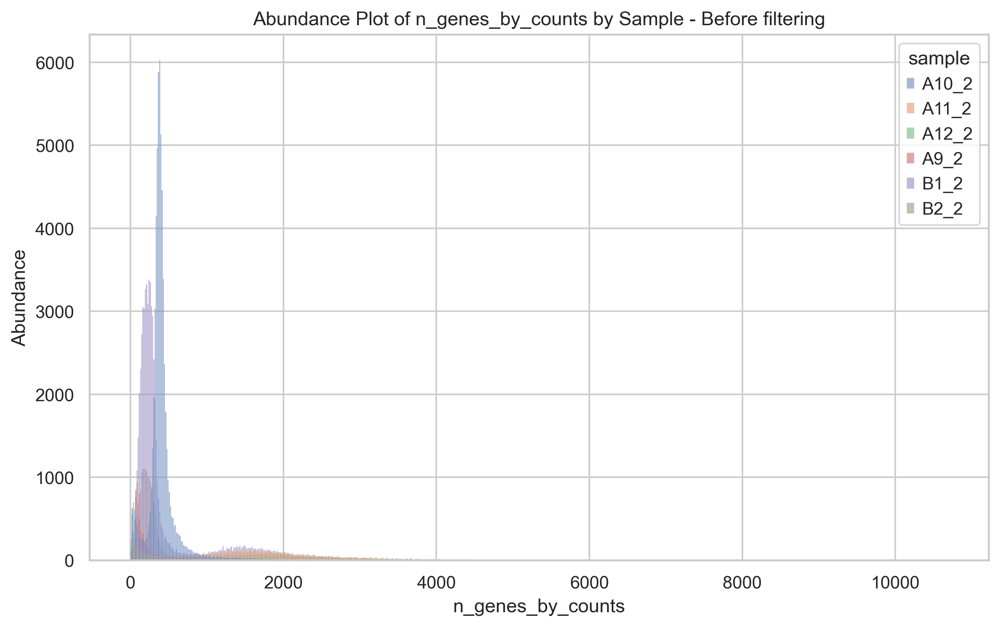

In [51]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'n_genes_by_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = sample_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - Before filtering')
plt.show()

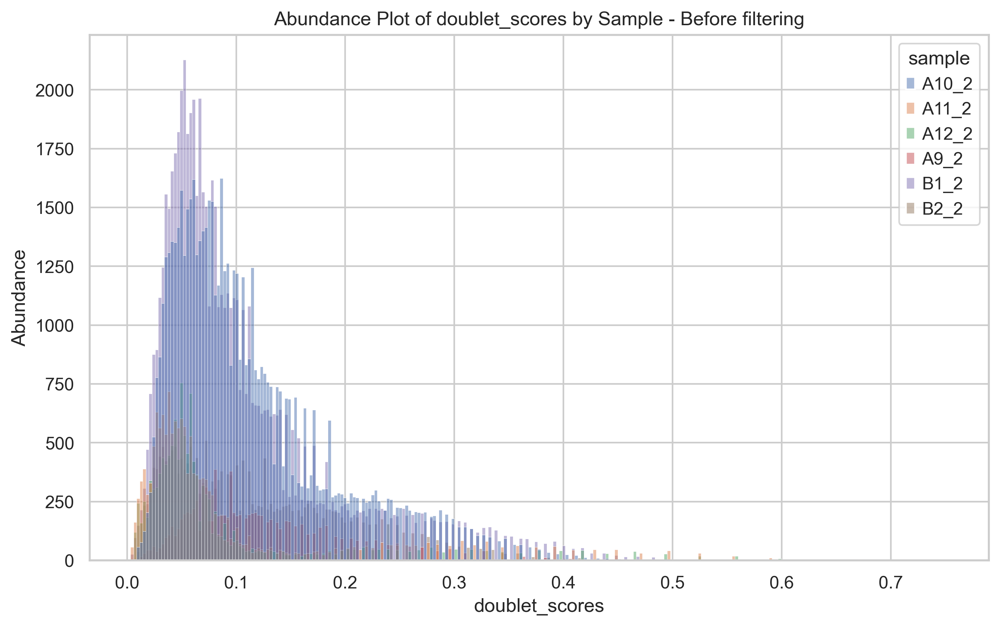

In [52]:
sb.set(style="whitegrid")
covariate_to_visualize = 'doublet_scores'

plt.figure(figsize=(10, 6))
sb.histplot(data=sample_object.obs, x=covariate_to_visualize, hue='sample', stat='count', common_norm=False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - Before filtering')
plt.show()

In [53]:
sample_object.shape

(188253, 32285)

### Filtering based on QC metrics

In [54]:
filtered_object = sample_object[sample_object.obs['n_genes_by_counts'] > 200]
filtered_object = filtered_object[filtered_object.obs['n_genes_by_counts'] < 6000]

filtered_object = filtered_object[filtered_object.obs['total_counts'] > 200]
filtered_object = filtered_object[filtered_object.obs['total_counts'] < 18000]

filtered_object = filtered_object[filtered_object.obs['pct_counts_mt'] < 60]
filtered_object = filtered_object[filtered_object.obs['pct_counts_ribo'] < 20]

filtered_object = filtered_object[filtered_object.obs['doublet_scores'] < 0.35]

filtered_object

View of AnnData object with n_obs × n_vars = 144357 × 32285
    obs: 'sample', 'genotype', 'batch', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'

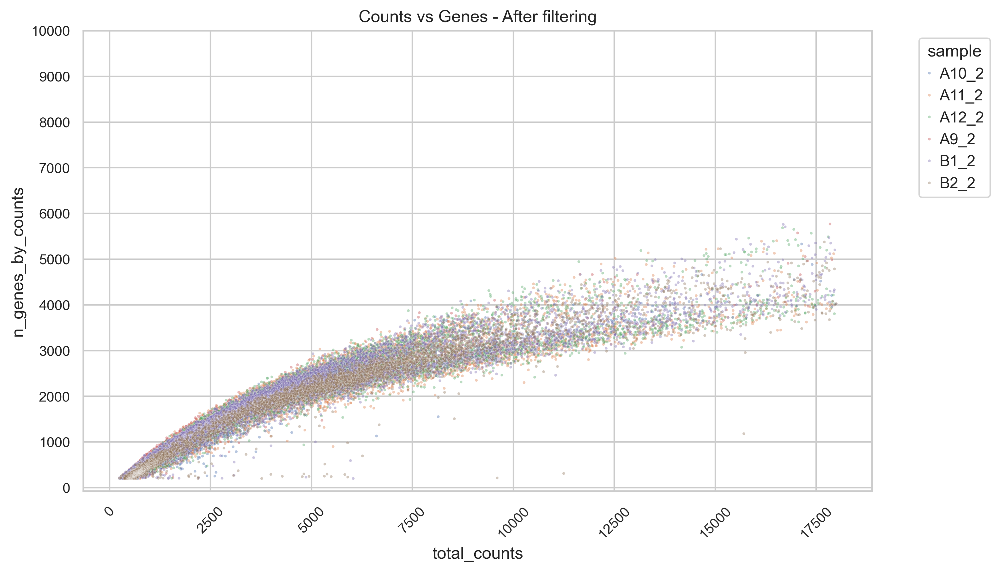

In [55]:
plt.figure(figsize=(10, 6))
sb.scatterplot(data=filtered_object.obs, x='total_counts', y='n_genes_by_counts' , hue ='sample', alpha = 0.4, s=4)
plt.legend(title='sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, fontsize = 10)
plt.yticks(fontsize = 10)
plt.yticks(range(0, int(max(sample_object.obs['n_genes_by_counts'])) + 1, 1000),fontsize = 10)
plt.title(f'Counts vs Genes - After filtering')
plt.show()

Text(0.5, 1.0, 'Mt and Ribo percentages - After filtering')

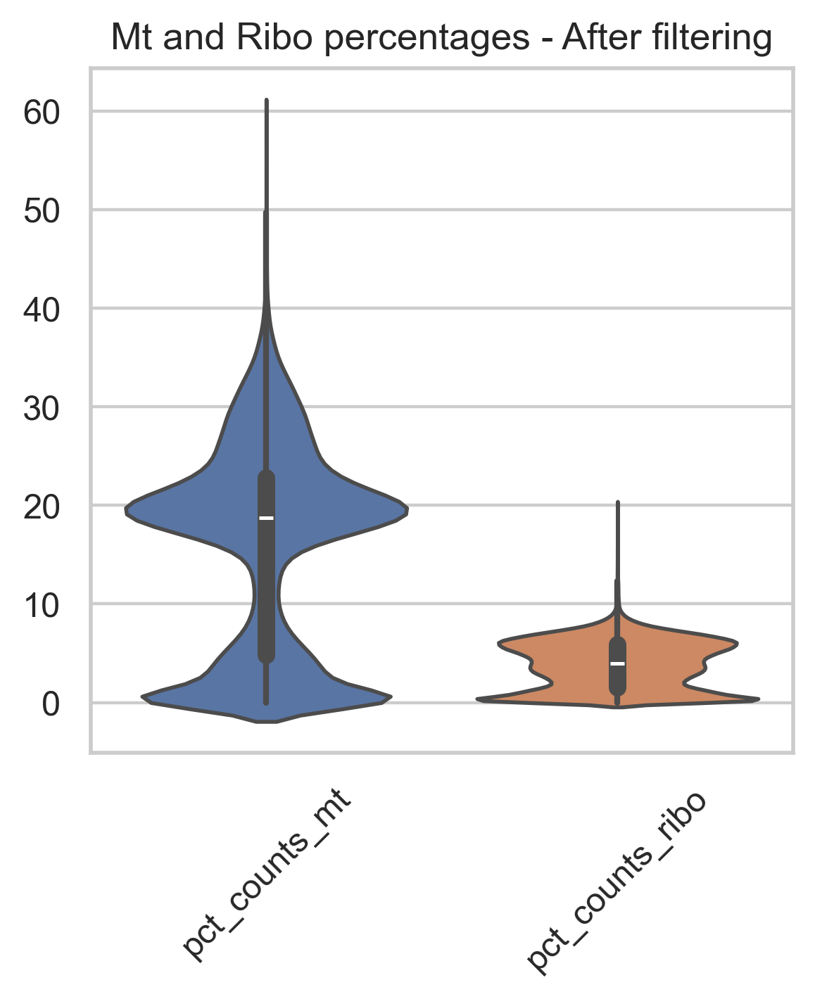

In [56]:
variables = ['pct_counts_mt', 'pct_counts_ribo']

sb.violinplot(data=filtered_object.obs[variables])
plt.xticks(rotation=45)
plt.title(f'Mt and Ribo percentages - After filtering')

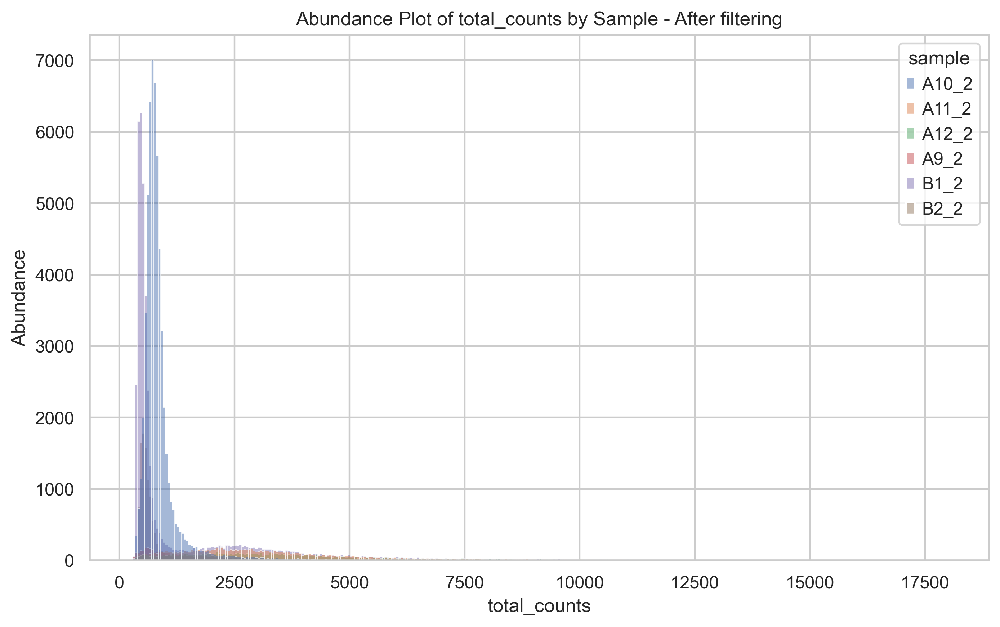

In [57]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'total_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = filtered_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - After filtering')
plt.show()

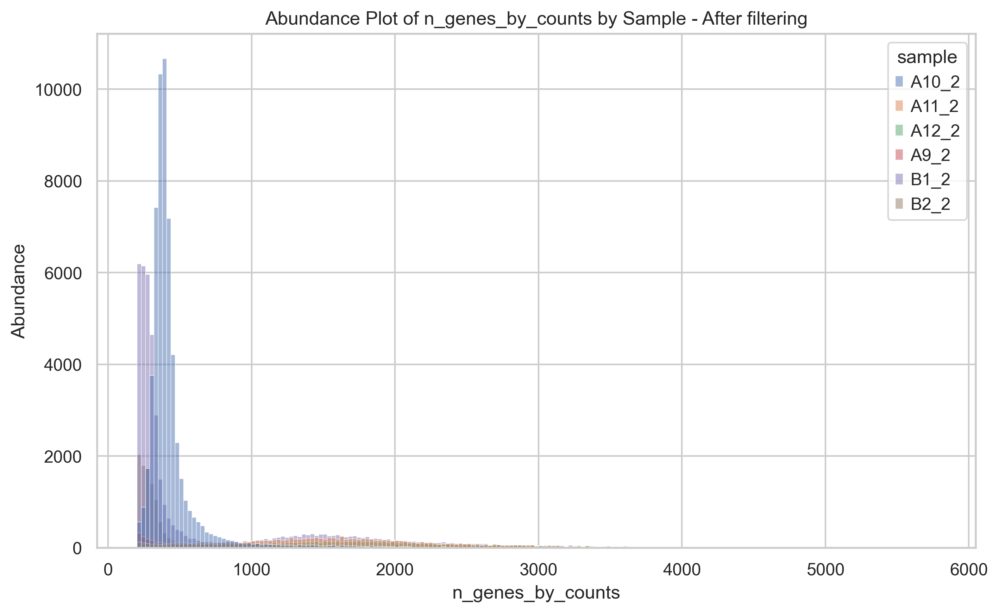

In [58]:
sb.set(style = "whitegrid")
covariate_to_visualize = 'n_genes_by_counts'

plt.figure(figsize = (10, 6))
sb.histplot(data = filtered_object.obs, x = covariate_to_visualize, hue = 'sample', stat = 'count', common_norm = False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - After filtering')
plt.show()

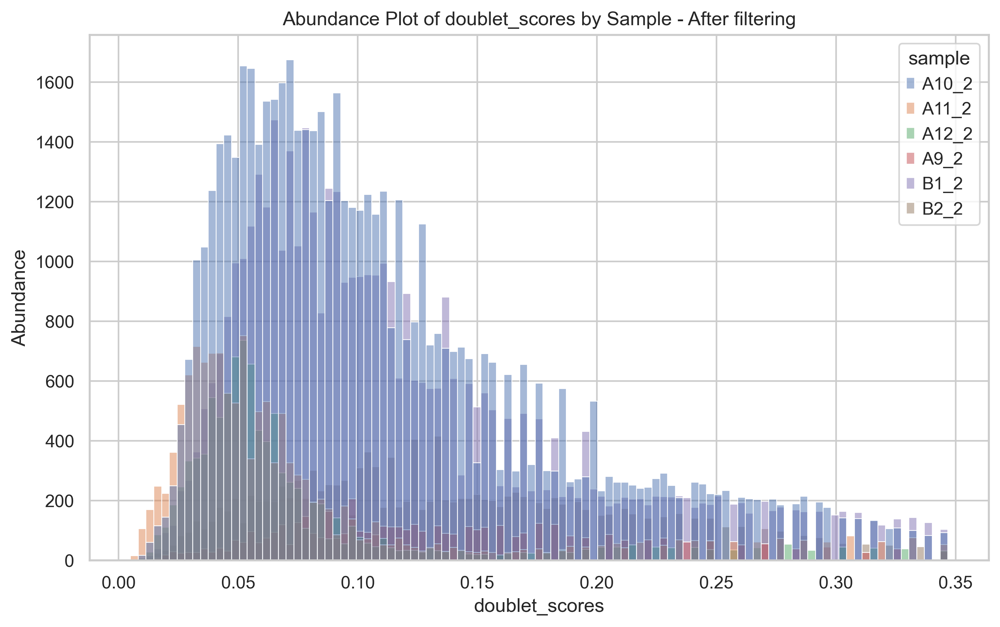

In [59]:
sb.set(style="whitegrid")
covariate_to_visualize = 'doublet_scores'

plt.figure(figsize=(10, 6))
sb.histplot(data=filtered_object.obs, x=covariate_to_visualize, hue='sample', stat='count', common_norm=False)
plt.xlabel(covariate_to_visualize)
plt.ylabel('Abundance')
plt.title(f'Abundance Plot of {covariate_to_visualize} by Sample - After filtering')
plt.show()

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/402557926.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = filtered_object.obs.groupby('sample')[var].median()


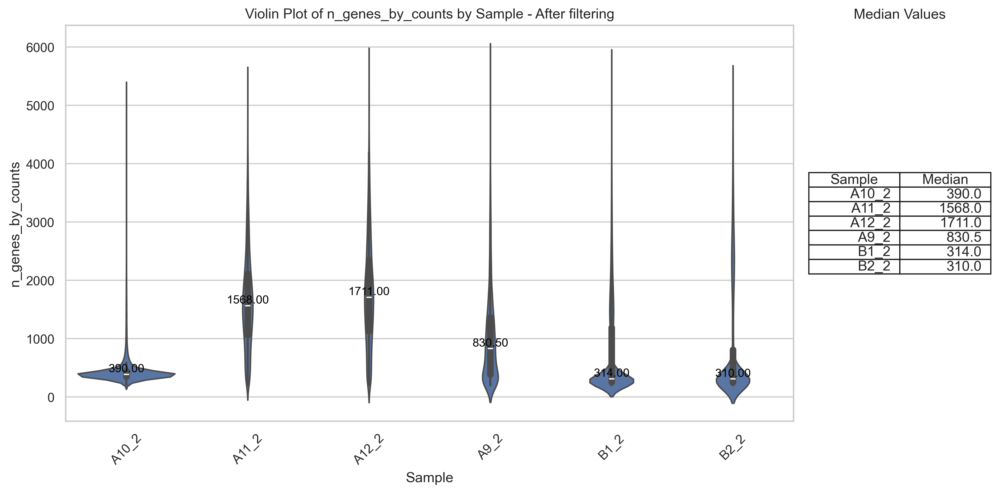

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/402557926.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = filtered_object.obs.groupby('sample')[var].median()


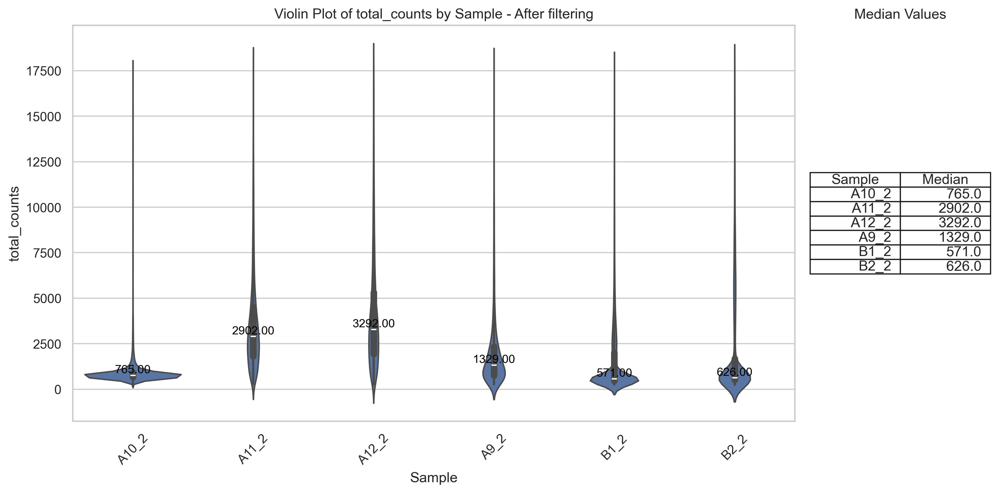

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/402557926.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = filtered_object.obs.groupby('sample')[var].median()


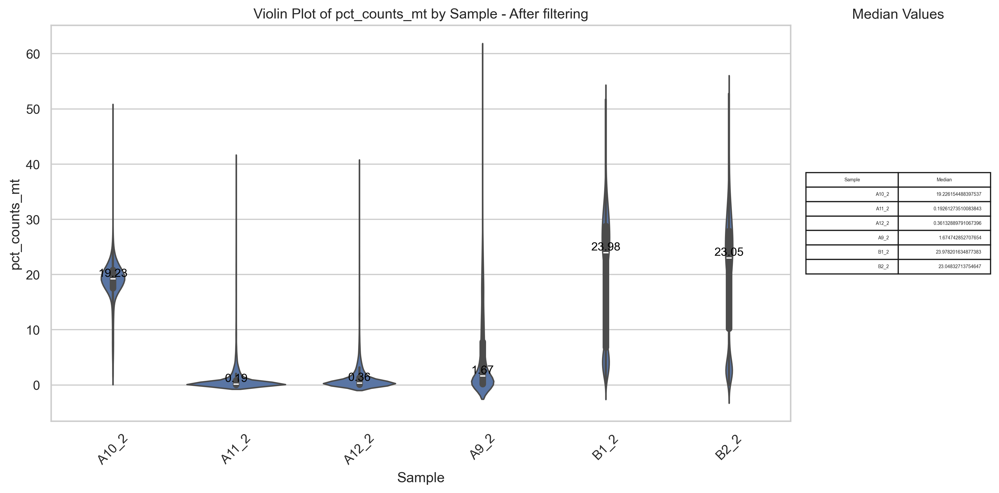

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/402557926.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = filtered_object.obs.groupby('sample')[var].median()


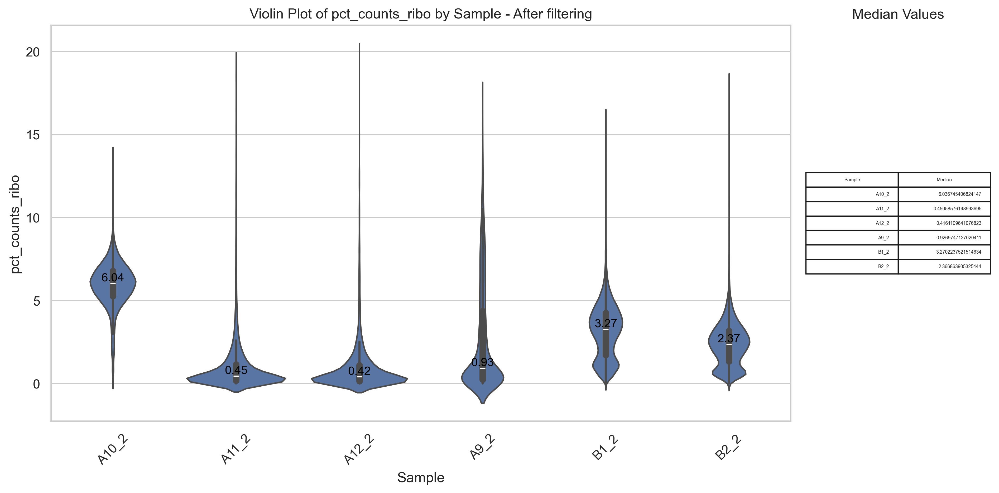

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/402557926.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = filtered_object.obs.groupby('sample')[var].median()


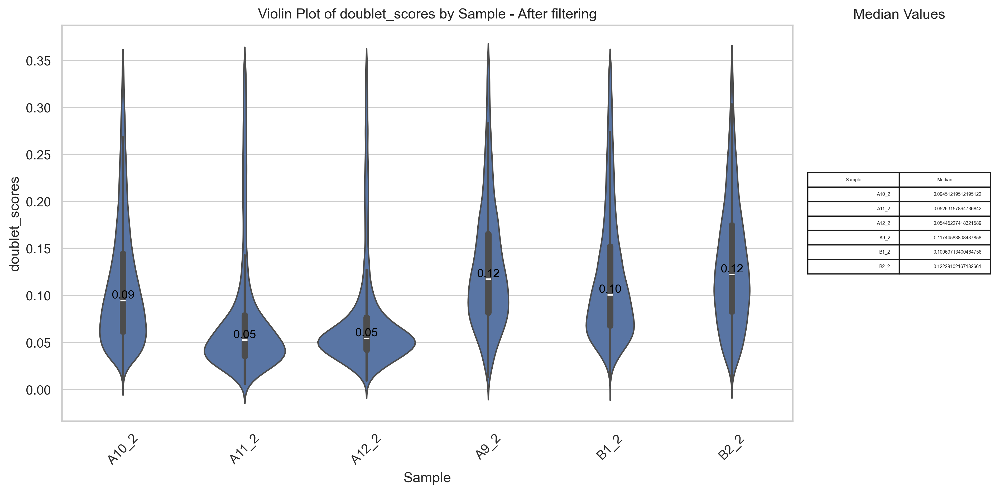

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/402557926.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = filtered_object.obs.groupby('sample')[var].median()


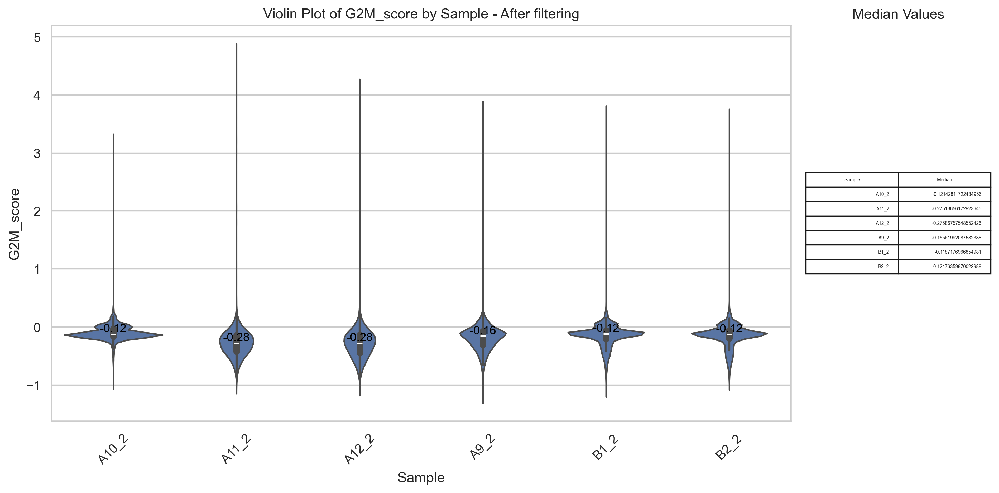

/var/folders/m6/j4jl72rj0pl7_bbwngtxl9ym0000gn/T/ipykernel_78977/402557926.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = filtered_object.obs.groupby('sample')[var].median()


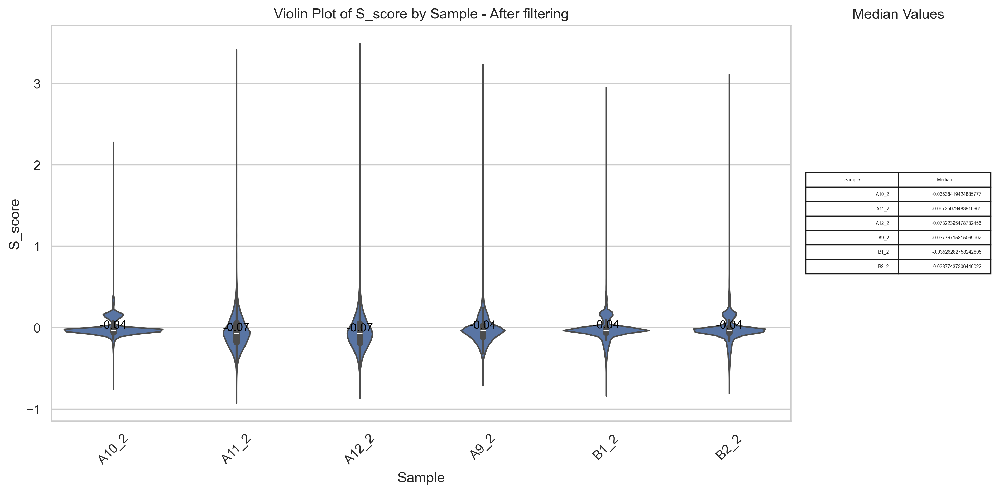

In [60]:
variables = 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'doublet_scores', 'G2M_score', 'S_score' 

for var in variables:

    fig, ax = plt.subplots(figsize=(12, 6), ncols=2, gridspec_kw={'width_ratios': [4, 1]})

    sb.violinplot(data=filtered_object.obs, x='sample', y=var, ax=ax[0])
   
    medians = filtered_object.obs.groupby('sample')[var].median()

    for sample, median in medians.items():
        ax[0].text(sample, median, f'{median:.2f}', ha='center', va='bottom', color='black', fontsize=10)
    
    ax[0].set_title(f'Violin Plot of {var} by Sample - After filtering')
    ax[0].set_xlabel('Sample')
    ax[0].set_ylabel(var)
    ax[0].tick_params(axis='x', rotation=45)

    median_df = pd.DataFrame({'Sample': medians.index, 'Median': medians.values})

    ax[1].axis('off')
    ax[1].table(cellText=median_df.values, colLabels=median_df.columns, loc='center')
    ax[1].set_title('Median Values')
    
    plt.tight_layout()
    plt.show()

## Data normalization

#### Steps followed

1. Creating a copy 
2. Saving counts as a layer without normalization
3. Normalizing cells and squaring them to root to stabilize

In [61]:
filtered_object.raw = filtered_object.copy()

filtered_object.layers['counts'] = filtered_object.X.copy()

filtered_object.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(filtered_object, inplace = False)["X"]
)

filtered_object

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 144357 × 32285
    obs: 'sample', 'genotype', 'batch', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_chrY', 'XIST-counts', 'XIST-percentage', 'gender_check_cov', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'sample_colors'
    layers: 'counts', 'sqrt_norm'

## Data Export

In [62]:
filtered_object.obs.dtypes

sample                category
genotype              category
batch                 category
doublet_scores         float64
predicted_doublets      object
n_genes_by_counts        int32
total_counts           float64
total_counts_mt        float64
pct_counts_mt          float64
total_counts_ribo      float64
pct_counts_ribo        float64
percent_chrY           float64
XIST-counts            float64
XIST-percentage        float64
gender_check_cov        object
S_score                float64
G2M_score              float64
phase                   object
dtype: object

In [63]:
filtered_object.obs['predicted_doublets'] = filtered_object.obs['predicted_doublets'].astype('category')

In [64]:
filtered_object.write_h5ad(path + f'heart_mm_nuclei_CB_QC_{timestamp}.raw.h5ad')